In [1]:
import pandas as pd
import seaborn as sns
import sklearn
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

### Data Etablissement

In [2]:
data = pd.read_csv("/Users/hugo/Desktop/Desu fichiers Jupyter/Projet Parcoursup/Data_ParcourSup.csv")

In [3]:
for col in data.columns:
    print(col)

Session
Statut de l’établissement de la filière de formation
Code UAI de l'établissement
Établissement
Code départemental de l’établissement
Département de l’établissement
Région de l’établissement
Académie de l’établissement
Commune de l’établissement
Filière de formation
Sélectivité
Filière de formation très agrégée
Filière de formation détaillée
Filière de formation.1
Filière de formation détaillée bis
Filière de formation très détaillée
Coordonnées GPS de la formation
Capacité de l’établissement par formation
Effectif total des candidats pour une formation
Dont effectif des candidates pour une formation
Effectif total des candidats en phase principale
Dont effectif des candidats ayant postulé en internat
Effectif des candidats néo bacheliers généraux en phase principale
Dont effectif des candidats boursiers néo bacheliers généraux en phase principale
Effectif des candidats néo bacheliers technologiques en phase principale
Dont effectif des candidats boursiers néo bacheliers technol

In [4]:
data.shape

(13644, 118)

In [5]:
drop = ['Filière de formation','Filière de formation détaillée bis','Filière de formation très agrégée','Filière de formation détaillée','Effectif des autres candidats ayant reçu une proposition d’admission de la part de l’établissement','Coordonnées GPS de la formation','Commune de l’établissement','Région de l’établissement','Académie de l’établissement','Session',"Code UAI de l'établissement",
        "Code départemental de l’établissement",'cod_aff_form',
        "Concours communs et banque d'épreuves",'Lien de la formation sur la plateforme Parcoursup',
        'list_com','Effectif total des candidats en phase complémentaire','Effectif des candidats néo bacheliers généraux en phase complémentaire',
       'Effectif des candidats néo bacheliers technologique en phase complémentaire','Effectif des candidats néo bacheliers professionnels en phase complémentaire',
       'Effectifs des autres candidats en phase complémentaire','Rang du dernier appelé du groupe 1','Rang du dernier appelé du groupe 2',
        'Rang du dernier appelé du groupe 3',"Concours communs et banque d'épreuves","etablissement_id_paysage",'composante_id_paysage',
       'Regroupement 1 effectué par les formations pour les classements','Regroupement 2 effectué par les formations pour les classements','Regroupement 3 effectué par les formations pour les classements',
       'tri','Part des terminales générales qui étaient en position de recevoir une proposition en phase principale','Part des terminales technologiques qui étaient en position de recevoir une proposition en phase principale',
       'Part des terminales professionnelles qui étaient en position de recevoir une proposition en phase principale',"% d’admis ayant reçu leur proposition d’admission à l'ouverture de la procédure principale",
        "% d’admis ayant reçu leur proposition d’admission avant le baccalauréat","% d’admis ayant reçu leur proposition d’admission avant la fin de la procédure principale","% d’admis dont filles","% d’admis néo bacheliers issus de la même académie",
        "% d’admis néo bacheliers issus de la même académie (Paris/Créteil/Versailles réunies)","% d’admis néo bacheliers boursiers","% d’admis néo bacheliers","% d’admis néo bacheliers sans information sur la mention au bac","% d’admis néo bacheliers sans mention au bac",
        "% d’admis néo bacheliers avec mention Assez Bien au bac","% d’admis néo bacheliers avec mention Bien au bac","% d’admis néo bacheliers avec mention Très Bien au bac","% d’admis néo bacheliers avec mention Très Bien avec félicitations au bac","% d’admis néo bacheliers généraux",
        "Dont % d’admis avec mention (BG)","% d’admis néo bacheliers technologiques","% d’admis néo bacheliers professionnels","Dont % d’admis avec mention (BP)",'Dont effectif des admis issus de la même académie (Paris/Créteil/Versailles réunies)','Effectif des candidats classés par l’établissement en phase complémentaire',
        "Dont effectif des admis ayant reçu leur proposition d’admission à l'ouverture de la procédure principale","Dont effectif des admis ayant reçu leur proposition d’admission avant le baccalauréat","Dont effectif des admis ayant reçu leur proposition d’admission avant la fin de la procédure principale",
        "Effectif total des candidats classés par l’établissement en phase principale","Effectif des candidats néo bacheliers généraux classés par l’établissement","Effectif total des candidats classés par l’établissement en phase principale","Effectif des candidats néo bacheliers généraux classés par l’établissement",
        "Dont effectif des candidats boursiers néo bacheliers généraux classés par l’établissement","Effectif des candidats néo bacheliers technologiques classés par l’établissement","Dont effectif des candidats boursiers néo bacheliers technologiques classés par l’établissement",
        "Effectif des candidats néo bacheliers professionnels classés par l’établissement","Dont effectif des candidats boursiers néo bacheliers professionnels classés par l’établissement","Effectif des autres candidats classés par l’établissement","Effectif total des candidats en phase principale",
        "Effectif des candidats néo bacheliers généraux en phase principale","Dont effectif des candidats boursiers néo bacheliers généraux en phase principale","Effectif des candidats néo bacheliers technologiques en phase principale","Dont effectif des candidats boursiers néo bacheliers technologiques en phase principale",
        "Effectif des candidats néo bacheliers professionnels en phase principale","Dont effectif des candidats boursiers néo bacheliers professionnels en phase principale","Effectif des autres candidats en phase principale",

        

       ]   

data = data.drop(columns = drop)

In [6]:
data.head(3)

,Statut de l’établissement de la filière de formation,Établissement,Département de l’établissement,Sélectivité,Filière de formation.1,Filière de formation très détaillée,Capacité de l’établissement par formation,Effectif total des candidats pour une formation,Dont effectif des candidates pour une formation,Dont effectif des candidats ayant postulé en internat,...,Dont effectif des admis issus de la même académie,% d’admis néo bacheliers issus du même établissement (BTS/CPGE),Dont % d’admis avec mention (BT),Effectif des candidats en terminale générale ayant reçu une proposition d’admission de la part de l’établissement,Dont effectif des candidats boursiers en terminale générale ayant reçu une proposition d’admission de la part de l’établissement,Effectif des candidats en terminale technologique ayant reçu une proposition d’admission de la part de l’établissement,Dont effectif des candidats boursiers en terminale technologique ayant reçu une proposition d’admission de la part de l’établissement,Effectif des candidats en terminale professionnelle ayant reçu une proposition d’admission de la part de l’établissement,Dont effectif des candidats boursiers en terminale générale professionnelle ayant reçu une proposition d’admission de la part de l’établissement,Taux d’accès
0,Public,Lycée Joseph Zobel,Martinique,formation sélective,BTS - Production,NaN,22,124,12,NaN,...,14,57.0,0.0,4.0,2.0,12.0,7.0,37.0,17.0,93.0
1,Public,I.U.T de la Martinique,Martinique,formation sélective,BUT - Service,NaN,24,165,51,NaN,...,12,NaN,25.0,23.0,6.0,32.0,14.0,3.0,3.0,55.0
2,Public,Lycée professionnel Leonard De Vinci,Hérault,formation sélective,BTS - Production,NaN,15,334,85,NaN,...,14,13.0,20.0,3.0,1.0,33.0,11.0,17.0,4.0,23.0


In [7]:
missing_values = data.isnull().sum()
columns_with_missing = missing_values[missing_values > 0]
print(columns_with_missing)

Filière de formation très détaillée                                         9682
Dont effectif des candidats ayant postulé en internat                      12670
Effectif des candidats classés par l’établissement en internat (CPGE)      12670
Effectif des candidats classés par l’établissement hors internat (CPGE)    12670
Dont effectif des admis en internat                                        12670
Dont effectif des admis issus du même établissement (BTS/CPGE)              7367
Dont effectif des admises issues du même établissement (BTS/CPGE)           7367
% d’admis néo bacheliers issus du même établissement (BTS/CPGE)             7405
Taux d’accès                                                                  95
dtype: int64


In [8]:
drop =['Filière de formation très détaillée','Dont effectif des candidats ayant postulé en internat','Effectif des candidats classés par l’établissement en internat (CPGE)',
"Effectif des candidats classés par l’établissement hors internat (CPGE)",'Dont effectif des admis en internat','Dont effectif des admis issus du même établissement (BTS/CPGE)',
'Dont effectif des admises issues du même établissement (BTS/CPGE)','% d’admis néo bacheliers issus du même établissement (BTS/CPGE)']

data = data.drop(columns = drop)

In [9]:
data.head()

,Statut de l’établissement de la filière de formation,Établissement,Département de l’établissement,Sélectivité,Filière de formation.1,Capacité de l’établissement par formation,Effectif total des candidats pour une formation,Dont effectif des candidates pour une formation,Effectif total des candidats ayant reçu une proposition d’admission de la part de l’établissement,Effectif total des candidats ayant accepté la proposition de l’établissement (admis),...,Effectif des admis néo bacheliers professionnels ayant eu une mention au bac,Dont effectif des admis issus de la même académie,Dont % d’admis avec mention (BT),Effectif des candidats en terminale générale ayant reçu une proposition d’admission de la part de l’établissement,Dont effectif des candidats boursiers en terminale générale ayant reçu une proposition d’admission de la part de l’établissement,Effectif des candidats en terminale technologique ayant reçu une proposition d’admission de la part de l’établissement,Dont effectif des candidats boursiers en terminale technologique ayant reçu une proposition d’admission de la part de l’établissement,Effectif des candidats en terminale professionnelle ayant reçu une proposition d’admission de la part de l’établissement,Dont effectif des candidats boursiers en terminale générale professionnelle ayant reçu une proposition d’admission de la part de l’établissement,Taux d’accès
0,Public,Lycée Joseph Zobel,Martinique,formation sélective,BTS - Production,22,124,12,55,14,...,6,14,0.0,4.0,2.0,12.0,7.0,37.0,17.0,93.0
1,Public,I.U.T de la Martinique,Martinique,formation sélective,BUT - Service,24,165,51,70,14,...,0,12,25.0,23.0,6.0,32.0,14.0,3.0,3.0,55.0
2,Public,Lycée professionnel Leonard De Vinci,Hérault,formation sélective,BTS - Production,15,334,85,53,15,...,4,14,20.0,3.0,1.0,33.0,11.0,17.0,4.0,23.0
3,Public,Université des Antilles - Pôle Martinique,Martinique,formation non sélective,Licence - Droit-économie-gestion,25,158,113,104,18,...,1,13,0.0,77.0,18.0,4.0,1.0,3.0,2.0,100.0
4,Public,Lycée Blaise Pascal,Haut-Rhin,formation sélective,BTS - Services,25,437,379,120,21,...,6,12,8.0,13.0,8.0,37.0,14.0,43.0,17.0,45.0


In [10]:
median = data["Taux d’accès"].median()  # Assurez-vous que l'accent est correctement saisi
data["Taux d’accès"].fillna(median, inplace=True)


In [11]:
data['Dont effectif des candidats pour une formation'] = data['Effectif total des candidats pour une formation'] - data['Dont effectif des candidates pour une formation']
data['Dont effectif des candidats admis'] = data['Effectif total des candidats ayant accepté la proposition de l’établissement (admis)'] - data['Dont effectif des candidates admises']

In [12]:
missing_values = data.isnull().sum()
columns_with_missing = missing_values[missing_values > 0]
print(columns_with_missing)

Series([], dtype: int64)


In [13]:
data.shape

(13644, 39)

In [14]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder

# Définissez les valeurs cibles que vous voulez encoder
valeurs_cibles = ['Public', 'Privé sous contrat d\'association', 'Privé enseignement supérieur','Privé hors contrat']

# Créez une instance de OneHotEncoder
encoder = OneHotEncoder(sparse=False)

# Appliquez le OneHotEncoder sur la colonne cible
encoded = encoder.fit_transform(data["Statut de l’établissement de la filière de formation"].values.reshape(-1, 1))

# Créez un DataFrame avec les nouvelles colonnes binaires
encoded_df = pd.DataFrame(encoded, columns=["Statut_" + val for val in valeurs_cibles])

# Concaténez le DataFrame original avec les nouvelles colonnes
data = pd.concat([data, encoded_df], axis=1)

# Supprimez la colonne d'origine car elle a été encodée
data.drop(columns=["Statut de l’établissement de la filière de formation"], inplace=True)


In [15]:
data["Sélectivité"] = data["Sélectivité"].replace({"formation sélective": 0, "formation non sélective": 1})

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13644 entries, 0 to 13643
Data columns (total 42 columns):
 #   Column                                                                                                                                            Non-Null Count  Dtype  
---  ------                                                                                                                                            --------------  -----  
 0   Établissement                                                                                                                                     13644 non-null  object 
 1   Département de l’établissement                                                                                                                    13644 non-null  object 
 2   Sélectivité                                                                                                                                       13644 non-null  int64  
 3   Filière de 

### Visualisation de carte

In [17]:
import plotly.express as px
import pandas as pd
import json

# Charger le fichier GeoJSON
with open("/Users/hugo/Desktop/Desu fichiers Jupyter/Projet Parcoursup/regions.geojson") as f:
    region = json.load(f)

with open("/Users/hugo/Desktop/Desu fichiers Jupyter/Projet Parcoursup/departements.geojson") as f:
    departement = json.load(f)

In [18]:
data_departement = data["Département de l’établissement"].value_counts()

print(data_departement)

data_departement = data_departement.reset_index()
data_departement.columns = ["Département", "Nombre d'établissements"]


Paris                      985
Nord                       683
Rhône                      578
Bouches-du-Rhône           426
Haute-Garonne              389
                          ... 
Etranger                    14
Ariège                      13
Hautes-Alpes                13
Alpes-de-Haute-Provence     12
Saint-Martin                 2
Name: Département de l’établissement, Length: 104, dtype: int64


In [19]:
correspondence_dict = {
     "Corse du Sud":"Corse-du-Sud","Côtes-d'armor":"Cotes-d'Armor","Côte-d'or":"Cote-d'Or","Val-d'oise":"Val-d'Oise"
}
data_departement['Département'] = data_departement['Département'].replace(correspondence_dict)


In [20]:
data_departement.head()

,Département,Nombre d'établissements
0,Paris,985
1,Nord,683
2,Rhône,578
3,Bouches-du-Rhône,426
4,Haute-Garonne,389


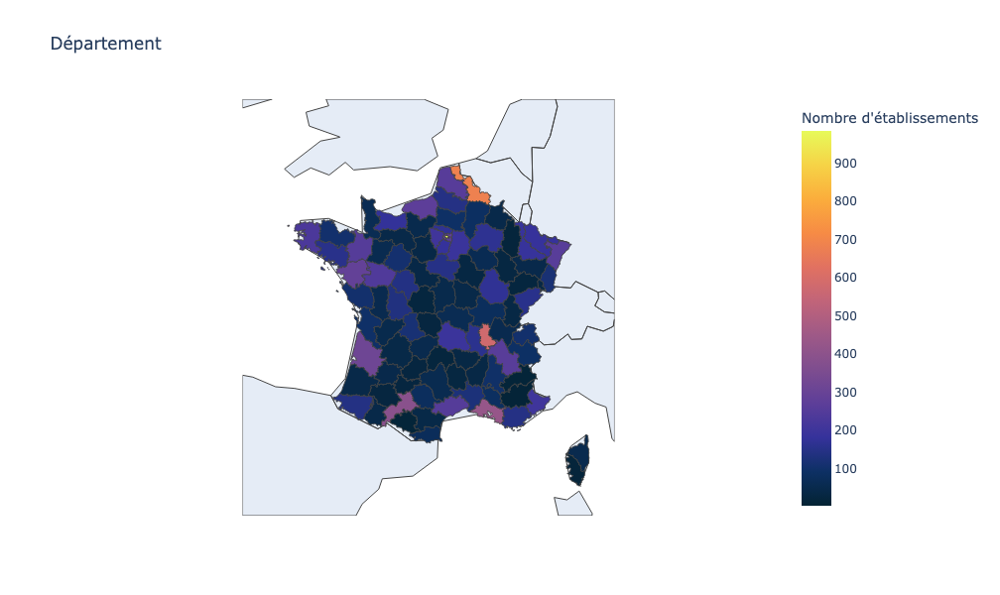

In [21]:
fig = px.choropleth(data_departement,
                    geojson=departement,
                    locations="Département",
                    featureidkey="properties.nom",  # Assurez-vous que cela correspond à la clé dans votre GeoJSON
                    color="Nombre d'établissements",
                    hover_name="Département",
                    color_continuous_scale="thermal",  # Choisissez une échelle de couleurs
                    title="Département")

fig.update_geos(scope="europe", center={"lat": 46.603354, "lon": 1.888334})
fig.update_geos(lonaxis_range=[-5, 10], lataxis_range=[40, 52])  # Ajustez les valeurs selon vos besoins
fig.update_layout(width=800, height=600)  # Vous pouvez ajuster les valeurs selon vos besoins



# Afficher la carte
fig.show()


### Visualisation

In [22]:
for col in data.columns:
    print(col)

Établissement
Département de l’établissement
Sélectivité
Filière de formation.1
Capacité de l’établissement par formation
Effectif total des candidats pour une formation
Dont effectif des candidates pour une formation
Effectif total des candidats ayant reçu une proposition d’admission de la part de l’établissement
Effectif total des candidats ayant accepté la proposition de l’établissement (admis)
Dont effectif des candidates admises
Effectif des admis en phase principale
Effectif des admis en phase complémentaire
Dont effectif des admis boursiers néo bacheliers
Effectif des admis néo bacheliers
Effectif des admis néo bacheliers généraux
Effectif des admis néo bacheliers technologiques
Effectif des admis néo bacheliers professionnels
Effectif des autres candidats admis
Dont effectif des admis néo bacheliers sans information sur la mention au bac
Dont effectif des admis néo bacheliers sans mention au bac
Dont effectif des admis néo bacheliers avec mention Assez Bien au bac
Dont effectif

In [23]:
data.head()

,Établissement,Département de l’établissement,Sélectivité,Filière de formation.1,Capacité de l’établissement par formation,Effectif total des candidats pour une formation,Dont effectif des candidates pour une formation,Effectif total des candidats ayant reçu une proposition d’admission de la part de l’établissement,Effectif total des candidats ayant accepté la proposition de l’établissement (admis),Dont effectif des candidates admises,...,Dont effectif des candidats boursiers en terminale technologique ayant reçu une proposition d’admission de la part de l’établissement,Effectif des candidats en terminale professionnelle ayant reçu une proposition d’admission de la part de l’établissement,Dont effectif des candidats boursiers en terminale générale professionnelle ayant reçu une proposition d’admission de la part de l’établissement,Taux d’accès,Dont effectif des candidats pour une formation,Dont effectif des candidats admis,Statut_Public,Statut_Privé sous contrat d'association,Statut_Privé enseignement supérieur,Statut_Privé hors contrat
0,Lycée Joseph Zobel,Martinique,0,BTS - Production,22,124,12,55,14,0,...,7.0,37.0,17.0,93.0,112,14,0.0,0.0,0.0,1.0
1,I.U.T de la Martinique,Martinique,0,BUT - Service,24,165,51,70,14,4,...,14.0,3.0,3.0,55.0,114,10,0.0,0.0,0.0,1.0
2,Lycée professionnel Leonard De Vinci,Hérault,0,BTS - Production,15,334,85,53,15,2,...,11.0,17.0,4.0,23.0,249,13,0.0,0.0,0.0,1.0
3,Université des Antilles - Pôle Martinique,Martinique,1,Licence - Droit-économie-gestion,25,158,113,104,18,14,...,1.0,3.0,2.0,100.0,45,4,0.0,0.0,0.0,1.0
4,Lycée Blaise Pascal,Haut-Rhin,0,BTS - Services,25,437,379,120,21,18,...,14.0,43.0,17.0,45.0,58,3,0.0,0.0,0.0,1.0


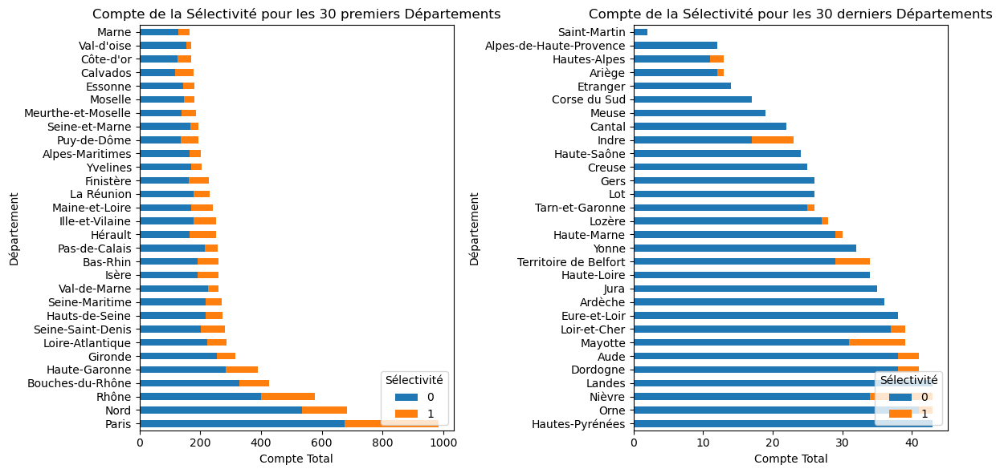

In [24]:
import matplotlib.pyplot as plt

# Vos données et traitement
counts = data.groupby(['Département de l’établissement', 'Sélectivité']).size().unstack(fill_value=0)

# Trier les départements par le total des occurrences de sélectivité
counts['Total'] = counts.sum(axis=1)
counts = counts.sort_values(by='Total', ascending=False).drop(columns='Total')

# Nombre de départements à afficher dans chaque sous-graphique
N = 30

# Création de la figure avec deux sous-graphiques (axes)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Premier sous-graphique (30 premiers départements)
top_N_departments = counts.head(N)
top_N_departments.plot(kind='barh', stacked=True, ax=ax1)
ax1.set_xlabel('Compte Total')
ax1.set_ylabel('Département')
ax1.set_title(f'Compte de la Sélectivité pour les {N} premiers Départements')
ax1.legend(title='Sélectivité', loc='lower right')

# Deuxième sous-graphique (30 derniers départements)
bottom_N_departments = counts.tail(N)
bottom_N_departments.plot(kind='barh', stacked=True, ax=ax2)
ax2.set_xlabel('Compte Total')
ax2.set_ylabel('Département')
ax2.set_title(f'Compte de la Sélectivité pour les {N} derniers Départements')
ax2.legend(title='Sélectivité', loc='lower right')

# Réglage de l'espacement entre les sous-graphiques
plt.tight_layout()

# Affichage du graphique avec les deux sous-graphiques
plt.show()


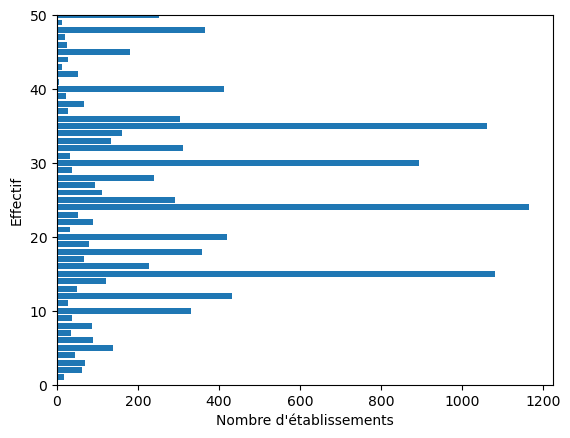

In [25]:
import matplotlib.pyplot as plt

# Vos données
counts = data['Capacité de l’établissement par formation'].value_counts()

# Triez les index pour obtenir les valeurs d'effectif dans l'ordre croissant
counts = counts.sort_index()

# Créez un graphique à barres horizontal
plt.barh(counts.index, counts.values)

# Ajoutez des étiquettes aux axes
plt.xlabel('Nombre d\'établissements')
plt.ylabel('Effectif')
# Réglez la limite pour mieux visualiser
plt.ylim(0, 50)

# Affichez le graphique
plt.show()


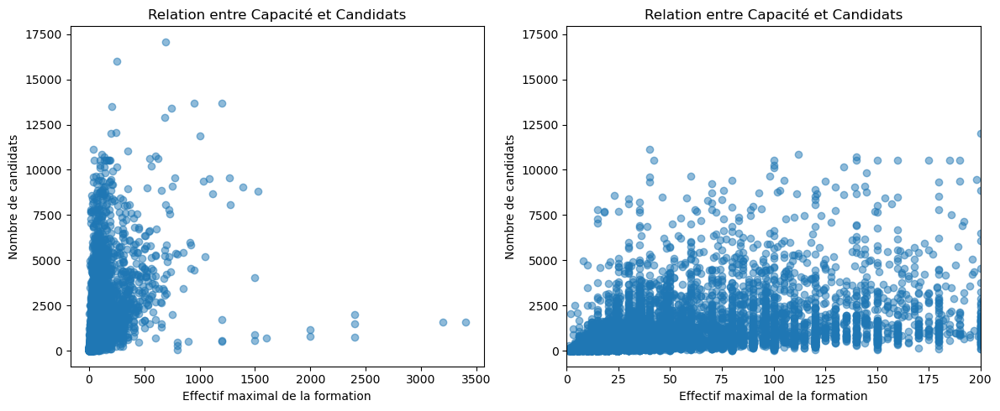

In [26]:
import matplotlib.pyplot as plt

# Vos données
cand = data["Effectif total des candidats pour une formation"]
cap = data['Capacité de l’établissement par formation']

# Créez une figure avec deux sous-graphiques côte à côte
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))  # Définissez figsize selon vos besoins

# Premier sous-graphique (scatter plot pour 'Effectif maximal de la formation vs Nombre de candidats')
ax1.scatter(cap, cand, alpha=0.5)
ax1.set_xlabel('Effectif maximal de la formation')
ax1.set_ylabel('Nombre de candidats')
ax1.set_title('Relation entre Capacité et Candidats')

# Deuxième sous-graphique (histogramme pour 'Effectif total des candidats pour une formation')
ax2.scatter(cap, cand, alpha=0.5)
ax2.set_xlabel('Effectif maximal de la formation')
ax2.set_ylabel('Nombre de candidats')
ax2.set_title('Relation entre Capacité et Candidats')
ax2.set_xlim(0, 200)  # Ajustez les limites selon vos besoins

# Réglage de l'espacement entre les sous-graphiques
plt.tight_layout()

# Affichez la figure
plt.show()


/Users/hugo/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/Users/hugo/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



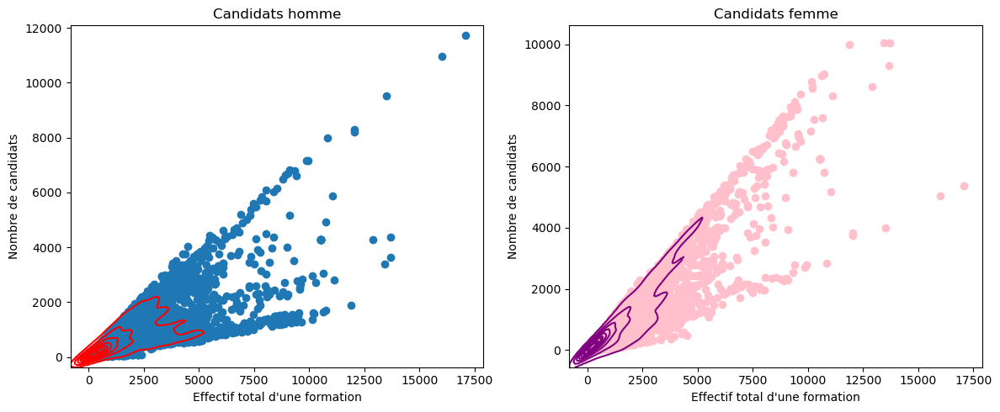

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

# Créez une figure avec une grille de 1 ligne et 2 colonnes
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # Ajustez la taille de la figure selon vos besoins

# Premier graphique à gauche
axes[0].scatter(data['Effectif total des candidats pour une formation'], data['Dont effectif des candidats pour une formation'])
axes[0].set_xlabel('Effectif total d\'une formation')
axes[0].set_ylabel('Nombre de candidats')
axes[0].set_title('Candidats homme')

# Ajoutez le KDE au premier graphique
sns.kdeplot(data['Effectif total des candidats pour une formation'],data['Dont effectif des candidats pour une formation'], ax=axes[0], color='red', label='KDE')

# Deuxième graphique à droite
axes[1].scatter(data['Effectif total des candidats pour une formation'], data['Dont effectif des candidates pour une formation'], c='pink')
axes[1].set_xlabel('Effectif total d\'une formation')
axes[1].set_ylabel('Nombre de candidats')
axes[1].set_title('Candidats femme')

# Ajoutez le KDE au deuxième graphique
sns.kdeplot(data['Effectif total des candidats pour une formation'], data['Dont effectif des candidates pour une formation'], ax=axes[1], color='purple', label='KDE')

# Affichez la figure
plt.tight_layout()  # Pour éviter que les étiquettes se chevauchent
plt.show()


/Users/hugo/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



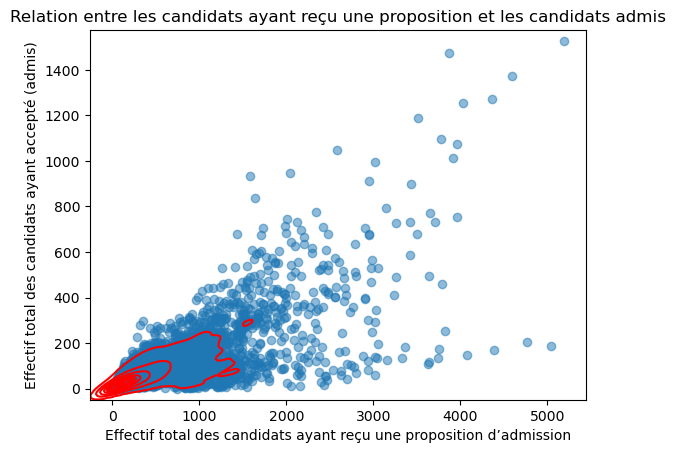

In [28]:
import matplotlib.pyplot as plt

# Vos données
effectif_proposition = data["Effectif total des candidats ayant reçu une proposition d’admission de la part de l’établissement"]
effectif_admis = data["Effectif total des candidats ayant accepté la proposition de l’établissement (admis)"]


# Créez un scatterplot
plt.scatter(effectif_proposition, effectif_admis, alpha=0.5)

# Ajoutez des étiquettes aux axes
plt.xlabel('Effectif total des candidats ayant reçu une proposition d’admission')
plt.ylabel('Effectif total des candidats ayant accepté (admis)')

# Ajoutez un titre
plt.title('Relation entre les candidats ayant reçu une proposition et les candidats admis')
sns.kdeplot(data['Effectif total des candidats ayant reçu une proposition d’admission de la part de l’établissement'], data['Effectif total des candidats ayant accepté la proposition de l’établissement (admis)'], color='red', label='KDE')

# Affichez le graphique
plt.show()


/Users/hugo/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/Users/hugo/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



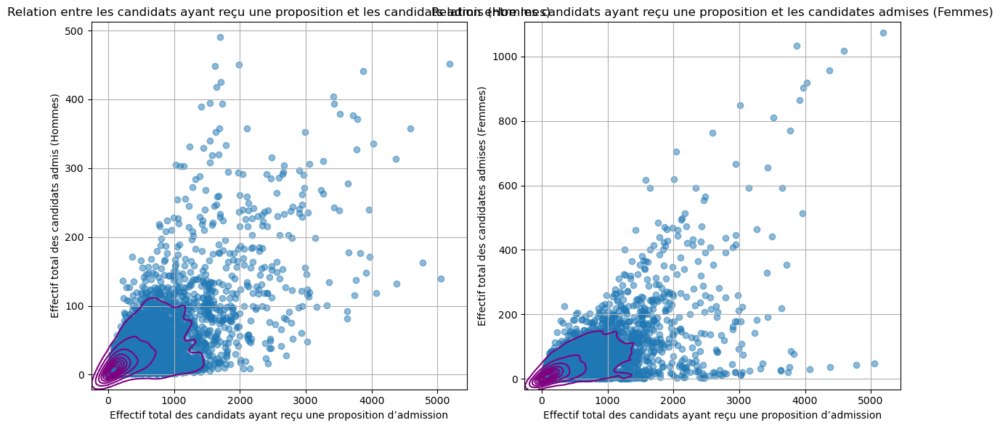

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns  # N'oubliez pas d'importer Seaborn

# Vos données
effectif_proposition = data["Effectif total des candidats ayant reçu une proposition d’admission de la part de l’établissement"]
effectif_admisH = data["Dont effectif des candidats admis"]
effectif_admisF = data["Dont effectif des candidates admises"]

# Créez une figure avec deux sous-graphiques (axes)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Premier sous-graphique (scatterplot pour les candidats admis (Hommes))
ax1.scatter(effectif_proposition, effectif_admisH, alpha=0.5)
ax1.set_xlabel('Effectif total des candidats ayant reçu une proposition d’admission')
ax1.set_ylabel('Effectif total des candidats admis (Hommes)')
ax1.set_title('Relation entre les candidats ayant reçu une proposition et les candidats admis (Hommes)')
ax1.grid(True)  # Ajoutez une grille en arrière-plan si nécessaire

# Deuxième sous-graphique (scatterplot pour les candidates admises (Femmes))
ax2.scatter(effectif_proposition, effectif_admisF, alpha=0.5)
ax2.set_xlabel('Effectif total des candidats ayant reçu une proposition d’admission')
ax2.set_ylabel('Effectif total des candidates admises (Femmes)')
ax2.set_title('Relation entre les candidats ayant reçu une proposition et les candidates admises (Femmes)')
ax2.grid(True)  # Ajoutez une grille en arrière-plan si nécessaire

# Utilisez sns.kdeplot pour ajouter les graphiques KDE
sns.kdeplot(data['Effectif total des candidats ayant reçu une proposition d’admission de la part de l’établissement'],
            data['Dont effectif des candidats admis'], ax=ax1, color='purple', label='KDE')
sns.kdeplot(data['Effectif total des candidats ayant reçu une proposition d’admission de la part de l’établissement'],
            data['Dont effectif des candidates admises'], ax=ax2, color='purple', label='KDE')

# Réglage de l'espacement entre les sous-graphiques
plt.tight_layout()

# Affichez la figure avec les deux sous-graphiques
plt.show()


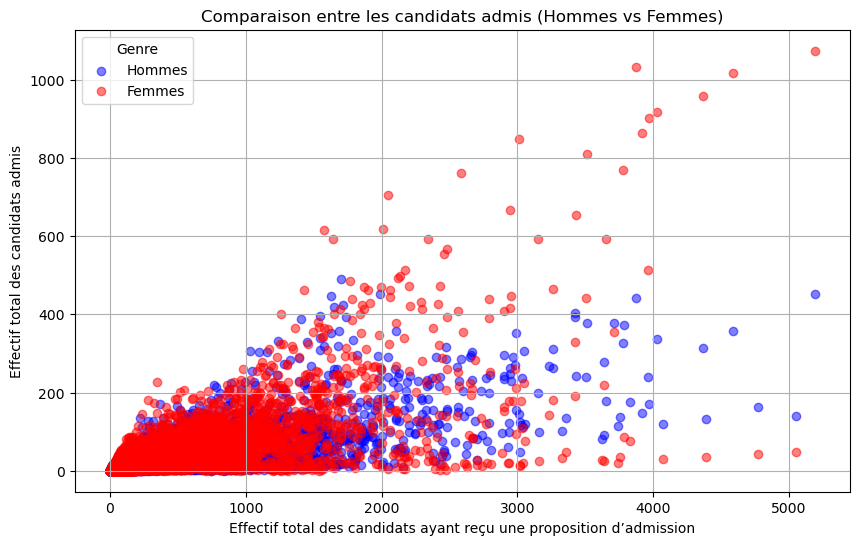

In [30]:
import matplotlib.pyplot as plt

# Vos données
effectif_proposition = data["Effectif total des candidats ayant reçu une proposition d’admission de la part de l’établissement"]
effectif_admisH = data["Dont effectif des candidats admis"]
effectif_admisF = data["Dont effectif des candidates admises"]

# Créez une figure avec un sous-graphique (axe)
fig, ax = plt.subplots(figsize=(10, 6))

# Scatterplot pour les candidats admis (Hommes)
ax.scatter(effectif_proposition, effectif_admisH, alpha=0.5, label='Hommes', color='blue')

# Scatterplot pour les candidates admises (Femmes)
ax.scatter(effectif_proposition, effectif_admisF, alpha=0.5, label='Femmes', color='red')

# Ajoutez une légende
ax.legend(title='Genre')

# Ajoutez des étiquettes aux axes et un titre
ax.set_xlabel('Effectif total des candidats ayant reçu une proposition d’admission')
ax.set_ylabel('Effectif total des candidats admis')
ax.set_title('Comparaison entre les candidats admis (Hommes vs Femmes)')

# Ajoutez une grille en arrière-plan si nécessaire
ax.grid(True)

# Affichez le graphique
plt.show()


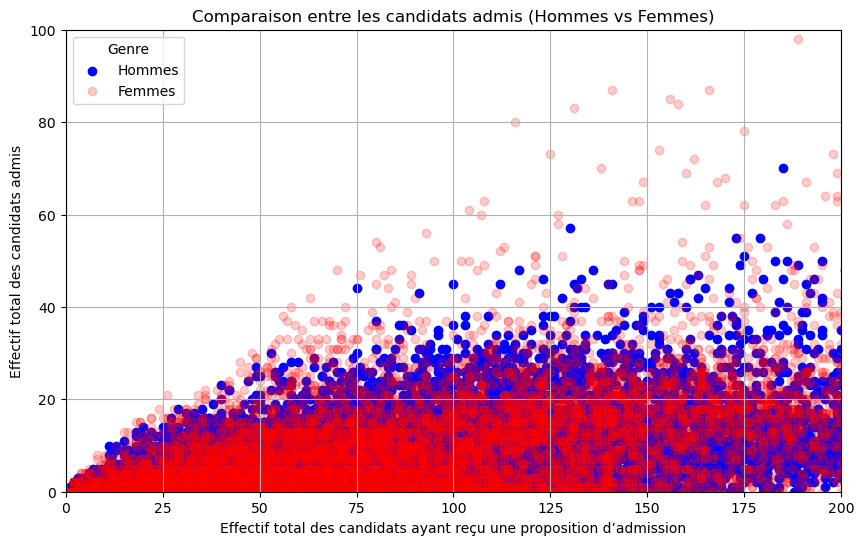

In [31]:
import matplotlib.pyplot as plt

# Vos données
effectif_proposition = data["Effectif total des candidats ayant reçu une proposition d’admission de la part de l’établissement"]
effectif_admisH = data["Dont effectif des candidats admis"]
effectif_admisF = data["Dont effectif des candidates admises"]

# Créez une figure avec un sous-graphique (axe)
fig, ax = plt.subplots(figsize=(10, 6))

# Scatterplot pour les candidats admis (Hommes)
ax.scatter(effectif_proposition, effectif_admisH, alpha=1, label='Hommes', color='blue')

# Scatterplot pour les candidates admises (Femmes)
ax.scatter(effectif_proposition, effectif_admisF, alpha=0.2, label='Femmes', color='red')

# Ajoutez une légende
ax.legend(title='Genre')

# Ajoutez des étiquettes aux axes et un titre
ax.set_xlabel('Effectif total des candidats ayant reçu une proposition d’admission')
ax.set_ylabel('Effectif total des candidats admis')
ax.set_title('Comparaison entre les candidats admis (Hommes vs Femmes)')
ax.set_xlim(0, 200)  # Ajustez les limites selon vos besoins
ax.set_ylim(0, 100)  # Ajustez les limites selon vos besoins

# Ajoutez une grille en arrière-plan si nécessaire
ax.grid(True)

# Affichez le graphique
plt.show()


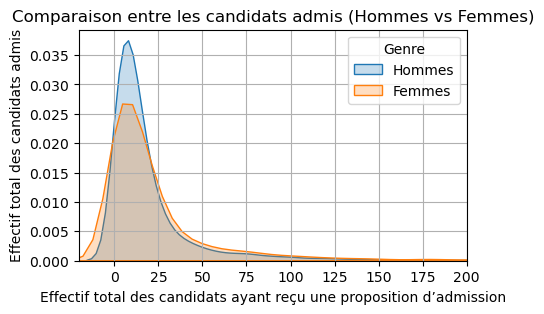

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# Vos données
effectif_proposition = data["Effectif total des candidats ayant reçu une proposition d’admission de la part de l’établissement"]
effectif_admisH = data["Dont effectif des candidats admis"]
effectif_admisF = data["Dont effectif des candidates admises"]

# Créez une figure avec un sous-graphique (axe)
fig, ax = plt.subplots(figsize=(5, 3))

# Courbe de densité pour les candidats admis (Hommes)
sns.kdeplot(effectif_admisH, cmap='Blues', shade=True, label='Hommes', ax=ax)

# Courbe de densité pour les candidates admises (Femmes)
sns.kdeplot(effectif_admisF, cmap='Reds', shade=True, label='Femmes', ax=ax)

# Ajoutez une légende
ax.legend(title='Genre')

# Ajoutez des étiquettes aux axes et un titre
ax.set_xlabel('Effectif total des candidats ayant reçu une proposition d’admission')
ax.set_ylabel('Effectif total des candidats admis')
ax.set_title('Comparaison entre les candidats admis (Hommes vs Femmes)')
ax.set_xlim (-20,200)
# Ajoutez une grille en arrière-plan si nécessaire
ax.grid(True)

# Affichez le graphique de densité
plt.show()


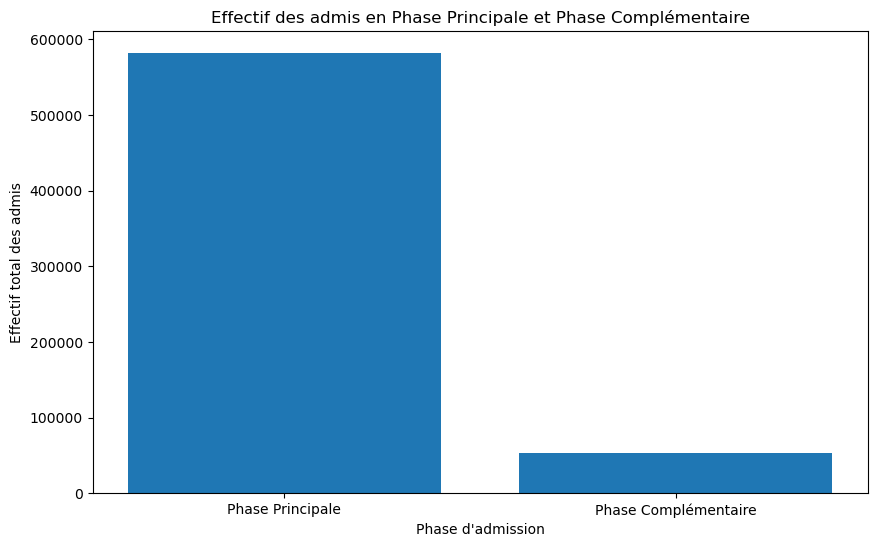

In [33]:
import matplotlib.pyplot as plt

# Vos données
effectif_principale = data["Effectif des admis en phase principale"]
effectif_complementaire = data["Effectif des admis en phase complémentaire"]

# Créez un barplot
plt.figure(figsize=(10, 6))
plt.bar(['Phase Principale', 'Phase Complémentaire'], [effectif_principale.sum(), effectif_complementaire.sum()])
plt.xlabel('Phase d\'admission')
plt.ylabel('Effectif total des admis')
plt.title('Effectif des admis en Phase Principale et Phase Complémentaire')
plt.show()


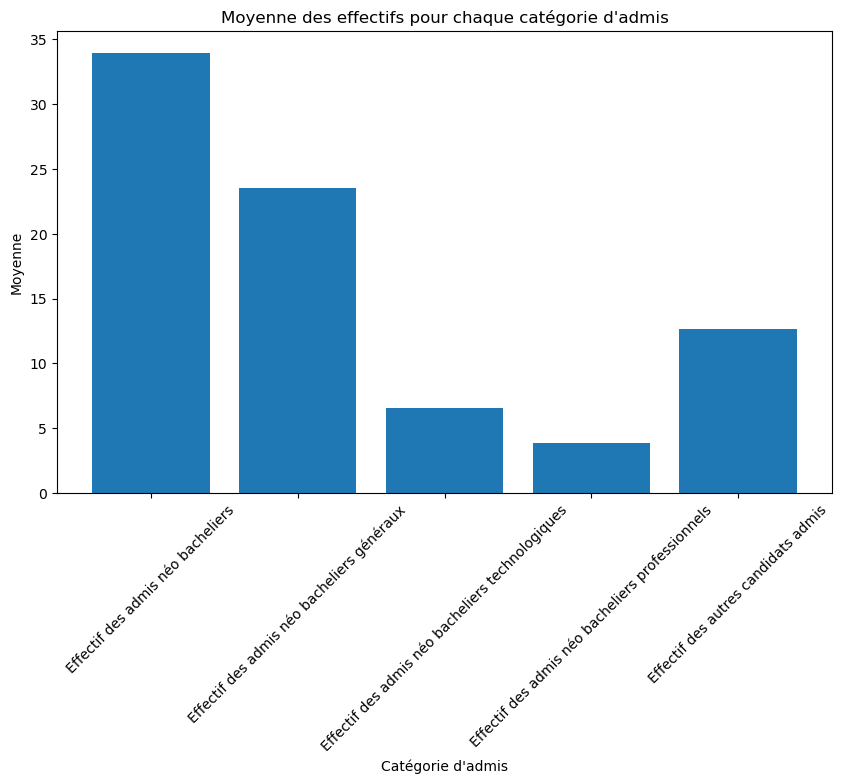

In [34]:
import matplotlib.pyplot as plt

# Les 5 colonnes spécifiées
columns_to_plot = [
    "Effectif des admis néo bacheliers",
    "Effectif des admis néo bacheliers généraux",
    "Effectif des admis néo bacheliers technologiques",
    "Effectif des admis néo bacheliers professionnels",
    "Effectif des autres candidats admis"
]

# Calcul des moyennes pour chaque colonne
mean_values = [data[column].mean() for column in columns_to_plot]

# Créez un barplot des moyennes
plt.figure(figsize=(10, 6))
plt.bar(columns_to_plot, mean_values)
plt.xlabel('Catégorie d\'admis')
plt.ylabel('Moyenne')
plt.title('Moyenne des effectifs pour chaque catégorie d\'admis')
plt.xticks(rotation=45)  # Faites pivoter les étiquettes de l'axe x pour une meilleure lisibilité
plt.show()


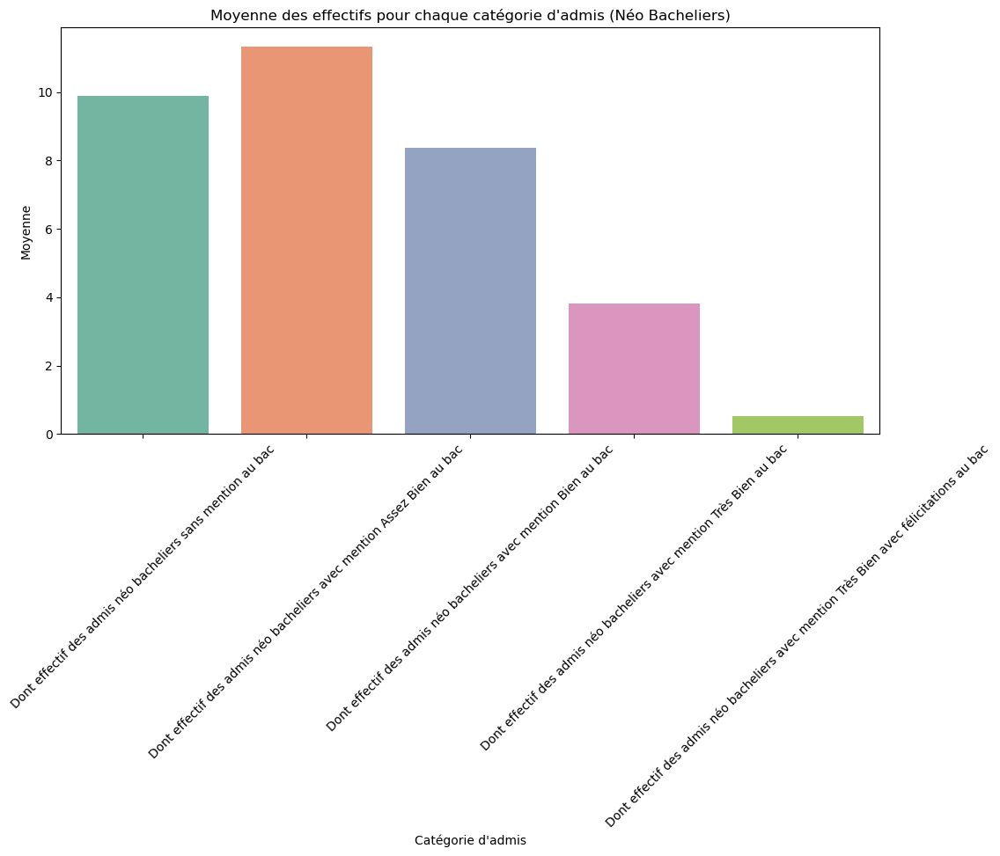

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Les 6 colonnes spécifiées
columns_to_plot = [
    "Dont effectif des admis néo bacheliers sans mention au bac",
    "Dont effectif des admis néo bacheliers avec mention Assez Bien au bac",
    "Dont effectif des admis néo bacheliers avec mention Bien au bac",
    "Dont effectif des admis néo bacheliers avec mention Très Bien au bac",
    "Dont effectif des admis néo bacheliers avec mention Très Bien avec félicitations au bac"
]

# Calcul des moyennes pour chaque colonne
mean_values = [data[column].mean() for column in columns_to_plot]

# Palette de couleurs personnalisée
custom_palette = sns.color_palette("Set2")

# Créez un barplot des moyennes avec la palette de couleurs personnalisée
plt.figure(figsize=(12, 6))
sns.barplot(x=columns_to_plot, y=mean_values, palette=custom_palette)
plt.xlabel('Catégorie d\'admis')
plt.ylabel('Moyenne')
plt.title('Moyenne des effectifs pour chaque catégorie d\'admis (Néo Bacheliers)')
plt.xticks(rotation=45)  # Faites pivoter les étiquettes de l'axe x pour une meilleure lisibilité
plt.show()


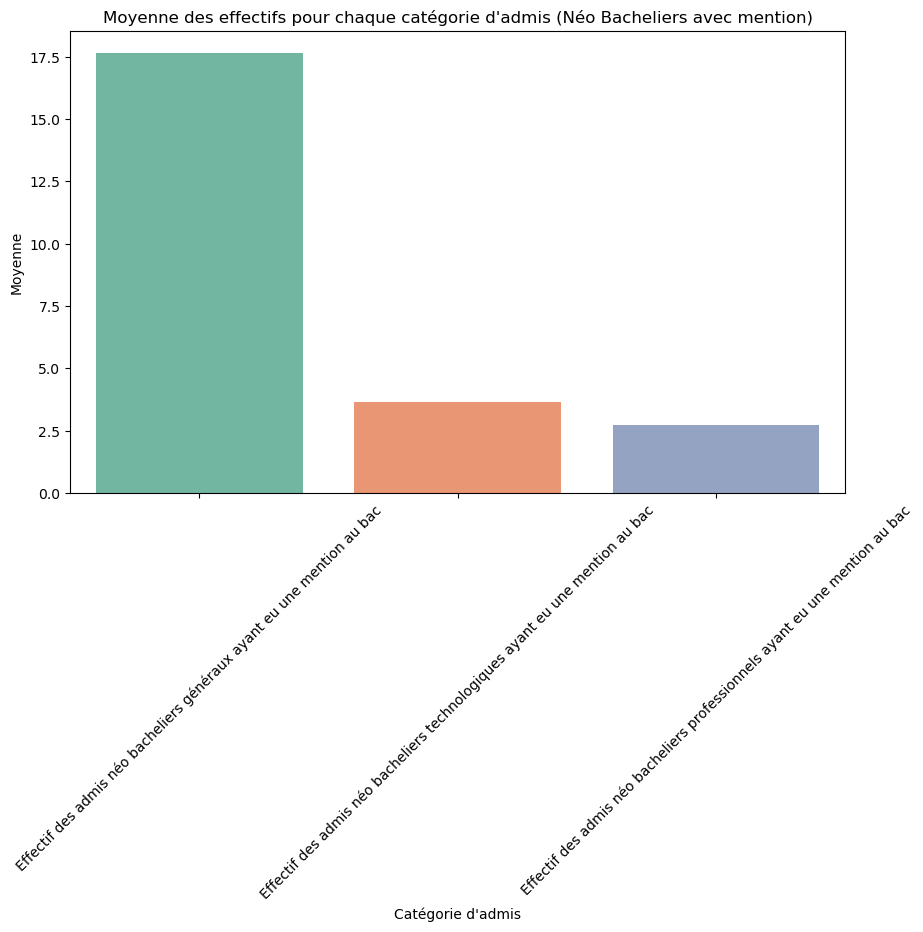

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Les 3 colonnes spécifiées
columns_to_plot = [
    "Effectif des admis néo bacheliers généraux ayant eu une mention au bac",
    "Effectif des admis néo bacheliers technologiques ayant eu une mention au bac",
    "Effectif des admis néo bacheliers professionnels ayant eu une mention au bac"
]

# Calcul des moyennes pour chaque colonne
mean_values = [data[column].mean() for column in columns_to_plot]

# Palette de couleurs personnalisée
custom_palette = sns.color_palette("Set2")

# Créez un barplot des moyennes avec la palette de couleurs personnalisée
plt.figure(figsize=(10, 6))
sns.barplot(x=columns_to_plot, y=mean_values, palette=custom_palette)
plt.xlabel('Catégorie d\'admis')
plt.ylabel('Moyenne')
plt.title('Moyenne des effectifs pour chaque catégorie d\'admis (Néo Bacheliers avec mention)')
plt.xticks(rotation=45)  # Faites pivoter les étiquettes de l'axe x pour une meilleure lisibilité
plt.show()


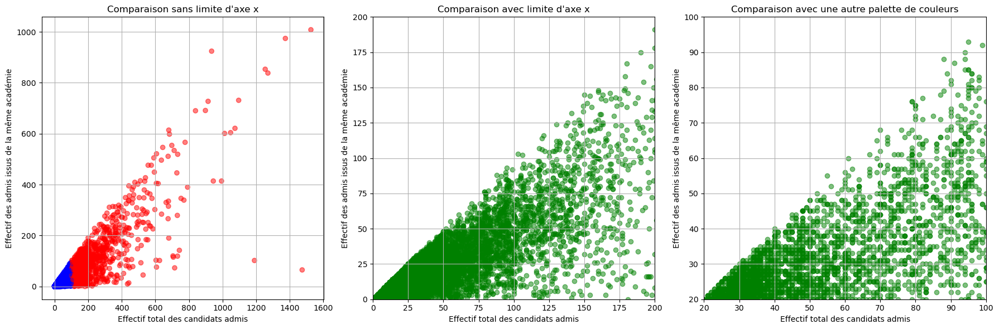

In [37]:
import matplotlib.pyplot as plt

# Les deux variables spécifiées
academie_admis = data["Dont effectif des admis issus de la même académie"]
effectif_total_admis = data["Effectif total des candidats ayant accepté la proposition de l’établissement (admis)"]

# Créez une figure avec trois sous-graphiques (axes)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

# Palette de couleurs personnalisée
custom_palette = ['red' if value > 100 else 'blue' for value in effectif_total_admis]

# Premier sous-graphique (sans limite d'axe x)
ax1.scatter(effectif_total_admis, academie_admis, alpha=0.5, c=custom_palette)
ax1.set_ylabel('Effectif des admis issus de la même académie')
ax1.set_xlabel('Effectif total des candidats admis')
ax1.set_title('Comparaison sans limite d\'axe x')
ax1.grid(True)

# Deuxième sous-graphique (avec limite d'axe x)
ax2.scatter(effectif_total_admis, academie_admis, alpha=0.5, c='green')
ax2.set_ylabel('Effectif des admis issus de la même académie')
ax2.set_xlabel('Effectif total des candidats admis')
ax2.set_title('Comparaison avec limite d\'axe x')
ax2.grid(True)

# Limitez l'axe x du deuxième sous-graphique (ajustez la limite selon vos besoins)
ax2.set_xlim(0, 200)  # Par exemple, de 0 à 200
ax2.set_ylim(0, 200)  # Par exemple, de 0 à 200

# Troisième sous-graphique (avec une autre palette de couleurs)
ax3.scatter(effectif_total_admis, academie_admis, alpha=0.5, c='green')
ax3.set_ylabel('Effectif des admis issus de la même académie')
ax3.set_xlabel('Effectif total des candidats admis')
ax3.set_title('Comparaison avec une autre palette de couleurs')
ax3.grid(True)

# Limitez l'axe x et y du troisième sous-graphique
ax3.set_xlim(20, 100)  # Par exemple, de 20 à 100
ax3.set_ylim(20, 100)  # Par exemple, de 20 à 100

# Réglez l'espacement entre les sous-graphiques
plt.tight_layout()

# Affichez la figure avec les trois sous-graphiques
plt.show()


/Users/hugo/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/Users/hugo/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/Users/hugo/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



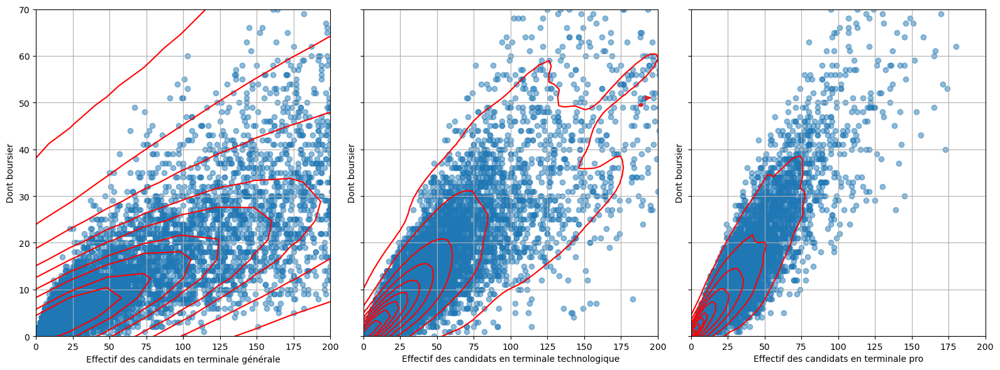

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns  # N'oubliez pas d'importer Seaborn

# Les six variables spécifiées
terminale_generale = data["Effectif des candidats en terminale générale ayant reçu une proposition d’admission de la part de l’établissement"]
boursiers_generale = data["Dont effectif des candidats boursiers en terminale générale ayant reçu une proposition d’admission de la part de l’établissement"]
terminale_technologique = data["Effectif des candidats en terminale technologique ayant reçu une proposition d’admission de la part de l’établissement"]
boursiers_technologique = data["Dont effectif des candidats boursiers en terminale technologique ayant reçu une proposition d’admission de la part de l’établissement"]
terminale_professionnelle = data["Effectif des candidats en terminale professionnelle ayant reçu une proposition d’admission de la part de l’établissement"]
boursiers_professionnelle = data["Dont effectif des candidats boursiers en terminale générale professionnelle ayant reçu une proposition d’admission de la part de l’établissement"]

# Créez une figure avec trois sous-graphiques (axes)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6), sharex=True, sharey=True)

# Premier sous-graphique (scatterplot pour terminale générale)
ax1.scatter(terminale_generale, boursiers_generale, alpha=0.5)
ax1.set_xlabel('Effectif des candidats en terminale générale')
ax1.set_ylabel('Dont boursier')
ax1.grid(True)
sns.kdeplot(terminale_generale, boursiers_generale, ax=ax1, color="red", shade=False)

# Deuxième sous-graphique (scatterplot pour terminale technologique)
ax2.scatter(terminale_technologique, boursiers_technologique, alpha=0.5)
ax2.set_xlabel('Effectif des candidats en terminale technologique')
ax2.set_ylabel('Dont boursier')
ax2.grid(True)
sns.kdeplot(terminale_technologique, boursiers_technologique, ax=ax2, color="red", shade=False)

# Troisième sous-graphique (scatterplot pour terminale professionnelle)
ax3.scatter(terminale_professionnelle, boursiers_professionnelle, alpha=0.5)
ax3.set_xlabel('Effectif des candidats en terminale pro')
ax3.set_ylabel('Dont boursier')
ax3.grid(True)
sns.kdeplot(terminale_professionnelle, boursiers_professionnelle, ax=ax3, color="red", shade=False)

ax2.set_xlim(0, 300)  # Par exemple, de 20 à 100
ax2.set_ylim(0, 70)  # Par exemple, de 20 à 100

ax3.set_xlim(0, 200)  # Par exemple, de 20 à 100
ax3.set_ylim(0, 70)  # Par exemple, de 20 à 100

# Réglez l'espacement entre les sous-graphiques
plt.tight_layout()

# Affichez la figure avec les trois sous-graphiques
plt.show()


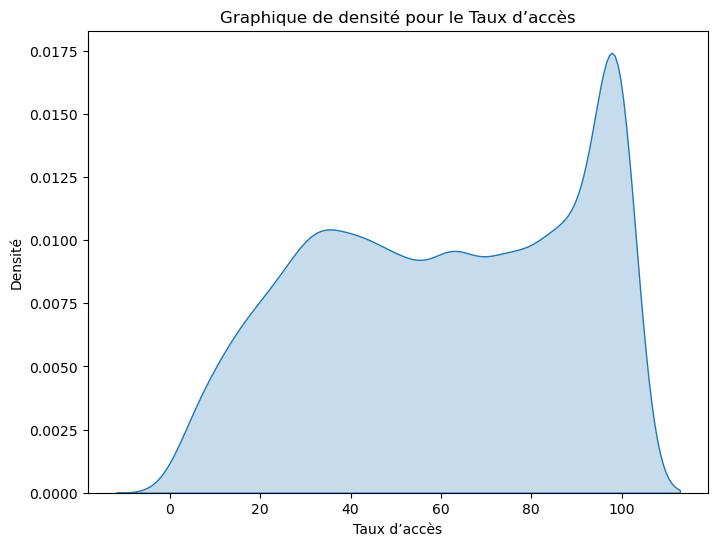

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

# La variable Taux d’accès
taux_acces = data["Taux d’accès"]

# Créez un graphique de densité (kernel density plot)
plt.figure(figsize=(8, 6))
sns.kdeplot(taux_acces, shade=True)
plt.xlabel('Taux d’accès')
plt.ylabel('Densité')
plt.title('Graphique de densité pour le Taux d’accès')

# Affichez le graphique de densité
plt.show()


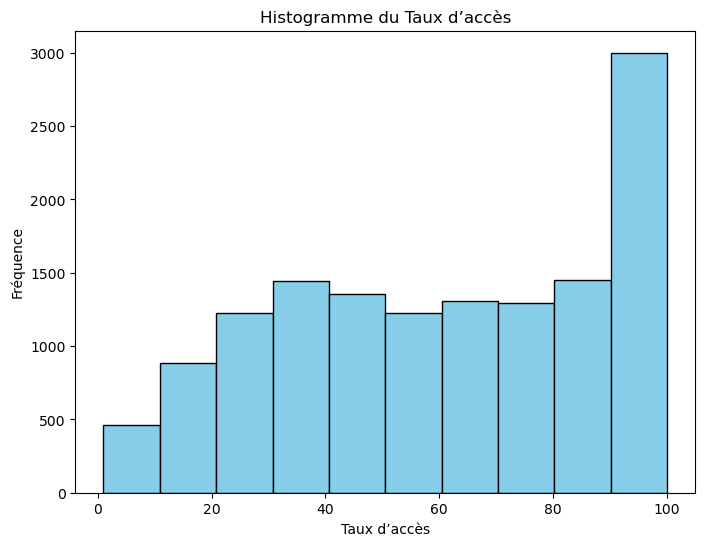

In [40]:
import matplotlib.pyplot as plt

# La variable Taux d’accès
taux_acces = data["Taux d’accès"]

# Créez un histogramme
plt.figure(figsize=(8, 6))
plt.hist(taux_acces, bins=10, color='skyblue', edgecolor='black')  # Vous pouvez ajuster le nombre de bacs (bins) selon vos besoins
plt.xlabel('Taux d’accès')
plt.ylabel('Fréquence')
plt.title('Histogramme du Taux d’accès')

# Affichez l'histogramme
plt.show()


### Corrélation

In [41]:
corr = data.copy()

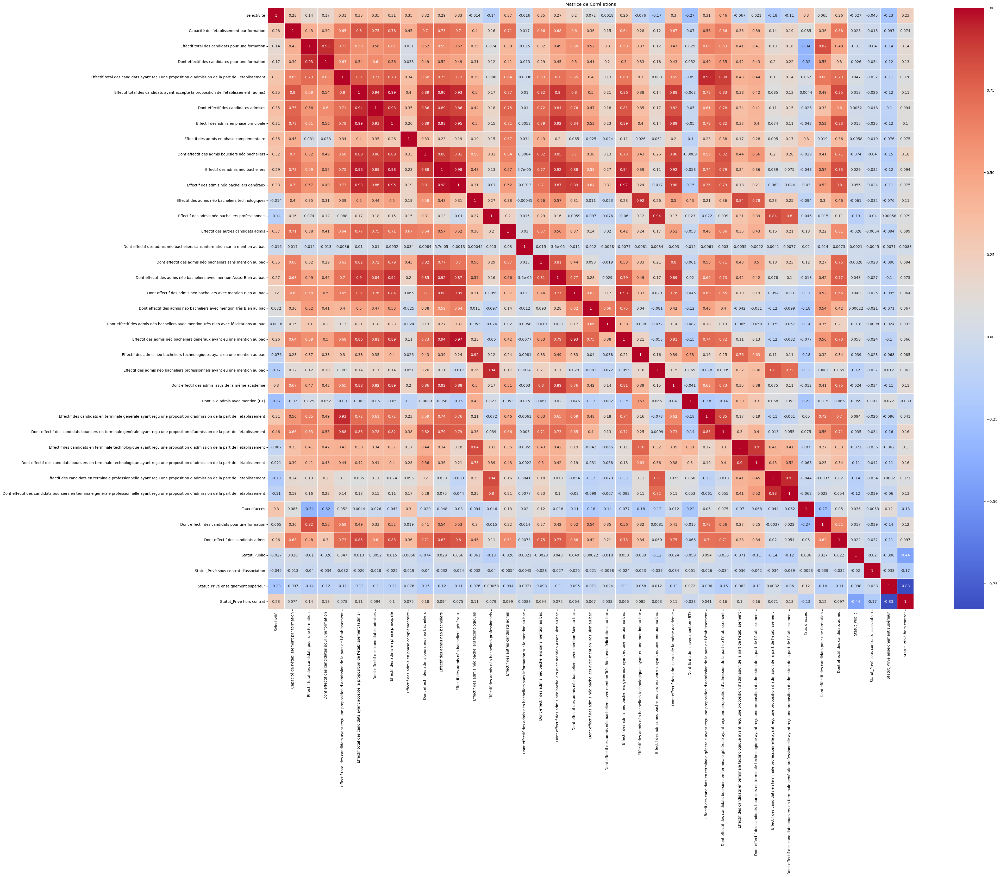

In [42]:
correla=corr.corr()

plt.figure(figsize=(40, 30))
sns.heatmap(correla, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Matrice de Corrélations')
plt.show()

### PCA

In [43]:
datanum = data.select_dtypes(include='number')

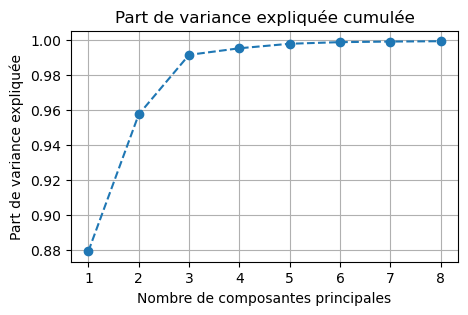

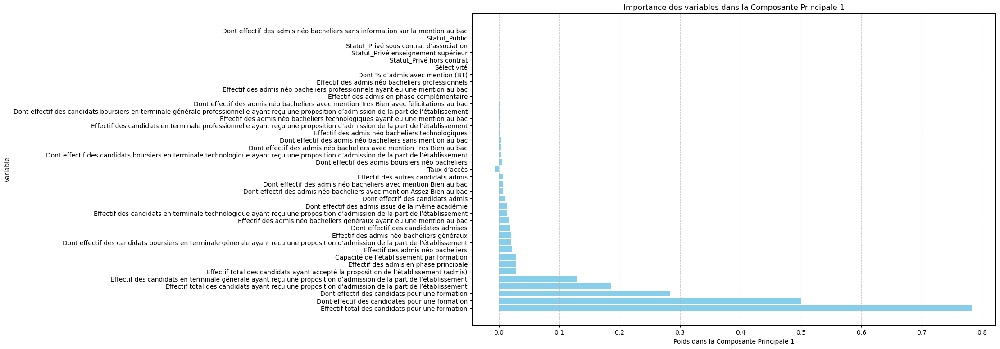

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Effectuez l'analyse en composantes principales (PCA)
pca = PCA(n_components=8)
pca.fit(datanum)

explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(5, 3))
plt.plot(range(1, 9), cumulative_variance, marker='o', linestyle='--')
plt.xticks(np.arange(1, 9, step=1))
plt.grid(True)
plt.title('Part de variance expliquée cumulée')
plt.xlabel('Nombre de composantes principales')
plt.ylabel('Part de variance expliquée')
plt.show()

# Accédez aux résultats de la composante 1
component_1 = pca.components_[0]
variable_names = datanum.columns

# Triez les variables par poids dans la première composante principale
sorted_variable_weights = sorted(zip(variable_names, component_1), key=lambda x: abs(x[1]), reverse=True)

# Créez un graphique à barres horizontales pour visualiser les poids des variables dans la première composante principale
plt.figure(figsize=(15, 9))
variables, weights = zip(*sorted_variable_weights)
plt.barh(variables, weights, color='skyblue')
plt.xlabel('Poids dans la Composante Principale 1')
plt.ylabel('Variable')
plt.title('Importance des variables dans la Composante Principale 1')
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.show()


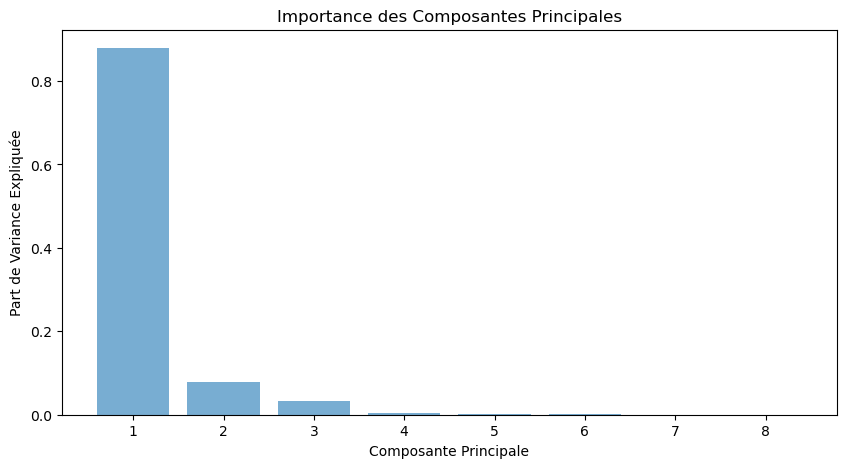

In [45]:
# Affichez l'importance des composantes
plt.figure(figsize=(10, 5))
plt.bar(range(1, 9), pca.explained_variance_ratio_, alpha=0.6, align='center')
plt.xticks(np.arange(1, 9, step=1))
plt.xlabel('Composante Principale')
plt.ylabel('Part de Variance Expliquée')
plt.title('Importance des Composantes Principales')
plt.show()

### Kmeans

Le but est de faire un clustering pour classer les établissements et faire une prédiction du style de gens qui ont le plus de chance d'être pris dans ce cluster

In [46]:
from sklearn.model_selection import train_test_split

X_train, X_test = train_test_split(data, test_size=0.2, random_state=42)

In [47]:
# Sélection des features
x_train = X_train[['Effectif total des candidats pour une formation','Dont effectif des candidates pour une formation']]

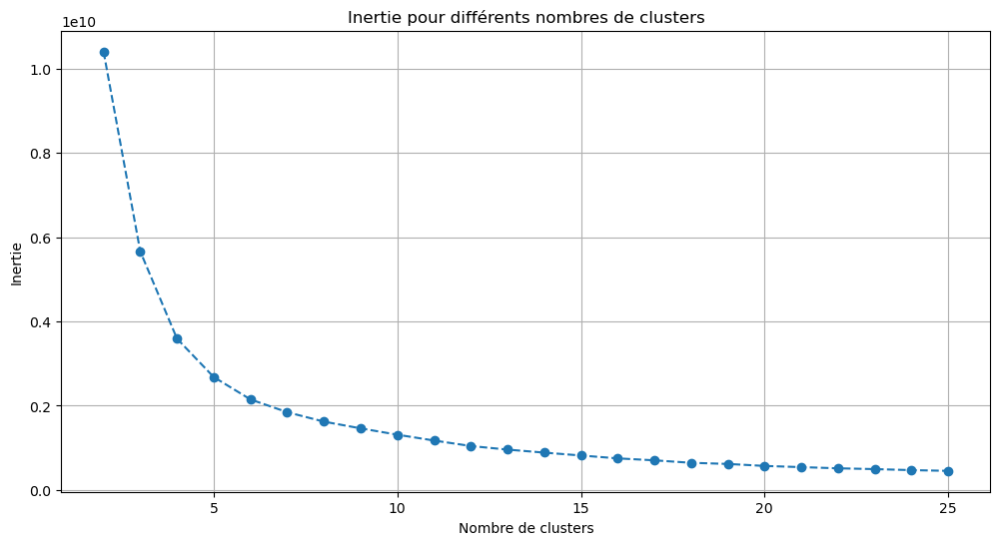

In [48]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Assurez-vous d'avoir vos données numériques dans le dataframe "datanum"
nombre_de_clusters_min = 2
nombre_de_clusters_max = 25

# Créez une liste pour stocker les valeurs d'inertie
inertias = []

for n_clusters in range(nombre_de_clusters_min, nombre_de_clusters_max + 1):
    # Créez un modèle K-Means pour le nombre actuel de clusters
    kmeans = KMeans(n_clusters=n_clusters)
    
    # Ajustez le modèle aux données
    kmeans.fit(x_train)  # Assurez-vous d'utiliser les données numériques ici
    
    # Calculez l'inertie et ajoutez-la à la liste
    inertia = kmeans.inertia_
    inertias.append(inertia)

# Affichez le score d'inertie
plt.figure(figsize=(12, 6))
plt.plot(range(nombre_de_clusters_min, nombre_de_clusters_max + 1), inertias, marker='o', linestyle='--')
plt.xlabel('Nombre de clusters')
plt.ylabel('Inertie')
plt.title('Inertie pour différents nombres de clusters')
plt.grid(True)
plt.show()


/var/folders/nc/zwpbzb650nzbqhz3qts17gt00000gn/T/ipykernel_2636/1932609584.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Nombre d'échantillons par cluster :
3     4412
8     2637
0     1527
5      684
6      427
12     250
16     245
14     184
4      142
1      118
10     103
13      62
2       46
15      38
7       30
11       5
9        5
Name: Cluster, dtype: int64


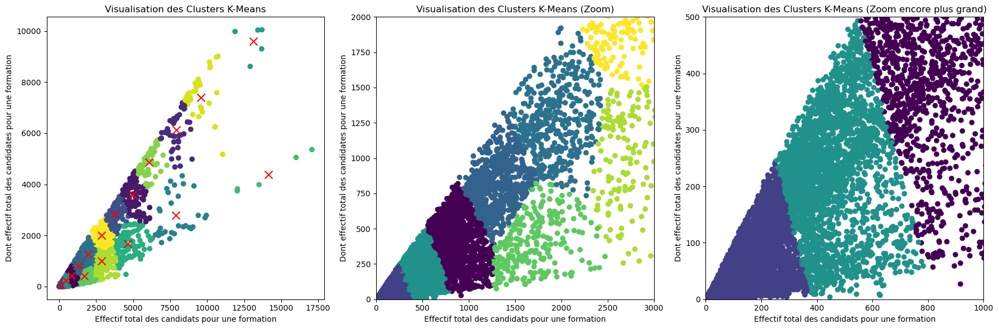

In [49]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Choisissez le nombre de clusters que vous souhaitez
nombre_de_clusters = 17  # Vous pouvez ajuster ce nombre en fonction de votre problème

# Créez un modèle K-Means
kmeans = KMeans(n_clusters=nombre_de_clusters)

# Ajustez le modèle aux données
kmeans.fit(x_train)  # Assurez-vous d'utiliser les données numériques ici

# Obtenez les labels de cluster attribués à chaque échantillon
labels1 = kmeans.labels_

# Ajoutez ces labels de cluster à votre dataframe de données
x_train['Cluster'] = labels1

# Obtenez les centres des clusters
cluster_centers = kmeans.cluster_centers_

# Affichez quelques statistiques sur les clusters
cluster_counts = x_train['Cluster'].value_counts()
print("Nombre d'échantillons par cluster :")
print(cluster_counts)

# Créez une figure avec trois sous-graphiques
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Premier sous-graphique
axes[0].scatter(x_train["Effectif total des candidats pour une formation"], x_train['Dont effectif des candidates pour une formation'], c=labels1, cmap='viridis')
axes[0].set_xlabel("Effectif total des candidats pour une formation")
axes[0].set_ylabel('Dont effectif total des candidates pour une formation')
axes[0].set_title('Visualisation des Clusters K-Means')

# Deuxième sous-graphique
axes[1].scatter(x_train["Effectif total des candidats pour une formation"], x_train['Dont effectif des candidates pour une formation'], c=labels1, cmap='viridis')
axes[1].set_xlabel("Effectif total des candidats pour une formation")
axes[1].set_ylabel('Dont effectif total des candidates pour une formation')
axes[1].set_title('Visualisation des Clusters K-Means (Zoom)')
axes[1].set_xlim(0, 3000)
axes[1].set_ylim(0, 2000)

# Troisième sous-graphique
axes[2].scatter(x_train["Effectif total des candidats pour une formation"], x_train['Dont effectif des candidates pour une formation'], c=labels1, cmap='viridis')
axes[2].set_xlabel("Effectif total des candidats pour une formation")
axes[2].set_ylabel('Dont effectif total des candidates pour une formation')
axes[2].set_title('Visualisation des Clusters K-Means (Zoom encore plus grand)')
axes[2].set_xlim(0, 1000)
axes[2].set_ylim(0, 500)

# Afficher les centres des clusters
for center in cluster_centers:
    axes[0].scatter(center[0], center[1], c='red', marker='x', s=100, label='Centroid')

# Afficher la figure
plt.tight_layout()
plt.show()


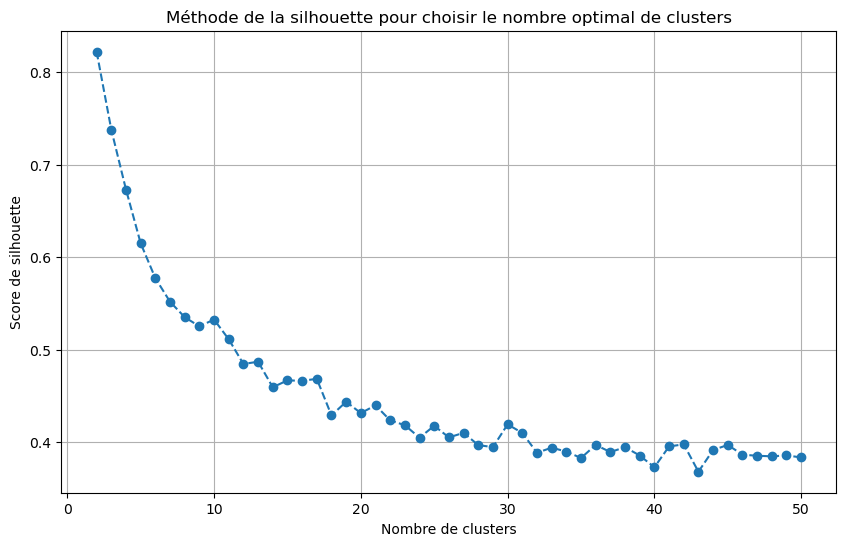

In [50]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

#Silhouette score

# Assurez-vous d'avoir vos données numériques dans le dataframe "datanum"
nombre_de_clusters = 50  # Nombre de clusters que vous souhaitez tester

# Créez une liste pour stocker les valeurs de silhouette
silhouette_scores = []

# Boucle sur différents nombres de clusters
for n_clusters in range(2, nombre_de_clusters + 1):
    # Créez un modèle K-Means pour le nombre actuel de clusters
    kmeans = KMeans(n_clusters=n_clusters)
    
    # Ajustez le modèle aux données
    kmeans.fit(x_train)  # Assurez-vous d'utiliser les données numériques ici
    
    # Obtenez les labels de cluster attribués à chaque échantillon
    labels2 = kmeans.labels_
    
    # Calculez le score de silhouette pour le nombre actuel de clusters
    silhouette_avg = silhouette_score(x_train, labels2)
    
    # Ajoutez le score de silhouette à la liste
    silhouette_scores.append(silhouette_avg)

# Affichez le score de silhouette pour différents nombres de clusters
plt.figure(figsize=(10, 6))
plt.plot(range(2, nombre_de_clusters + 1), silhouette_scores, marker='o', linestyle='--')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Méthode de la silhouette pour choisir le nombre optimal de clusters')
plt.grid(True)
plt.show()


### Comparaison de modèles de clustering

In [51]:
# Importez les autres méthodes de clustering
from sklearn.cluster import DBSCAN, AgglomerativeClustering, SpectralClustering

# Créez des modèles pour chaque méthode de clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
agglomerative = AgglomerativeClustering(n_clusters=17)
spectral = SpectralClustering(n_clusters=nombre_de_clusters, affinity='nearest_neighbors')

# Ajustez les modèles aux données
dbscan_labels = dbscan.fit_predict(x_train)
agglomerative_labels = agglomerative.fit_predict(x_train)
spectral_labels = spectral.fit_predict(x_train)

# Comparez les résultats avec l'indice de silhouette
from sklearn.metrics import silhouette_score

kmeans_silhouette = silhouette_score(x_train, labels1)
dbscan_silhouette = silhouette_score(x_train, dbscan_labels)
agglomerative_silhouette = silhouette_score(x_train, agglomerative_labels)
spectral_silhouette = silhouette_score(x_train, spectral_labels)

print(f"Silhouette Score (K-Means): {kmeans_silhouette:.2f}")
print(f"Silhouette Score (DBSCAN): {dbscan_silhouette:.2f}")
print(f"Silhouette Score (Agglomerative Clustering): {agglomerative_silhouette:.2f}")
print(f"Silhouette Score (Spectral Clustering): {spectral_silhouette:.2f}")

Silhouette Score (K-Means): 0.47
Silhouette Score (DBSCAN): -0.42
Silhouette Score (Agglomerative Clustering): 0.42
Silhouette Score (Spectral Clustering): 0.32


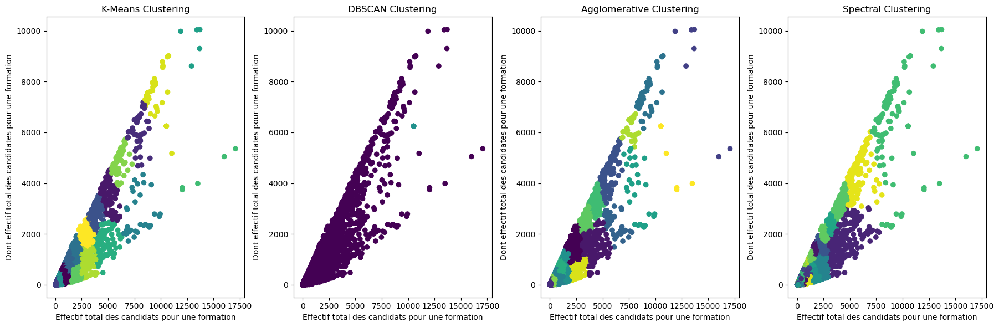

In [52]:
# Créez une figure avec trois sous-graphiques pour chaque méthode de clustering
fig, axes = plt.subplots(1, 4, figsize=(18, 6))

# Visualisation des clusters pour K-Means
axes[0].scatter(x_train["Effectif total des candidats pour une formation"], x_train['Dont effectif des candidates pour une formation'], c=labels1, cmap='viridis')
axes[0].set_xlabel("Effectif total des candidats pour une formation")
axes[0].set_ylabel('Dont effectif total des candidates pour une formation')
axes[0].set_title('K-Means Clustering')

# Visualisation des clusters pour DBSCAN
axes[1].scatter(x_train["Effectif total des candidats pour une formation"], x_train['Dont effectif des candidates pour une formation'], c=dbscan_labels, cmap='viridis')
axes[1].set_xlabel("Effectif total des candidats pour une formation")
axes[1].set_ylabel('Dont effectif total des candidates pour une formation')
axes[1].set_title('DBSCAN Clustering')

# Visualisation des clusters pour Agglomerative Clustering
axes[2].scatter(x_train["Effectif total des candidats pour une formation"], x_train['Dont effectif des candidates pour une formation'], c=agglomerative_labels, cmap='viridis')
axes[2].set_xlabel("Effectif total des candidats pour une formation")
axes[2].set_ylabel('Dont effectif total des candidates pour une formation')
axes[2].set_title('Agglomerative Clustering')

# Visualisation des clusters pour Spectral Clustering
axes[3].scatter(x_train["Effectif total des candidats pour une formation"], x_train['Dont effectif des candidates pour une formation'], c=spectral_labels, cmap='viridis')
axes[3].set_xlabel("Effectif total des candidats pour une formation")
axes[3].set_ylabel('Dont effectif total des candidates pour une formation')
axes[3].set_title('Spectral Clustering')

# Afficher la figure
plt.tight_layout()
plt.show()


### Clustering sur X_train 

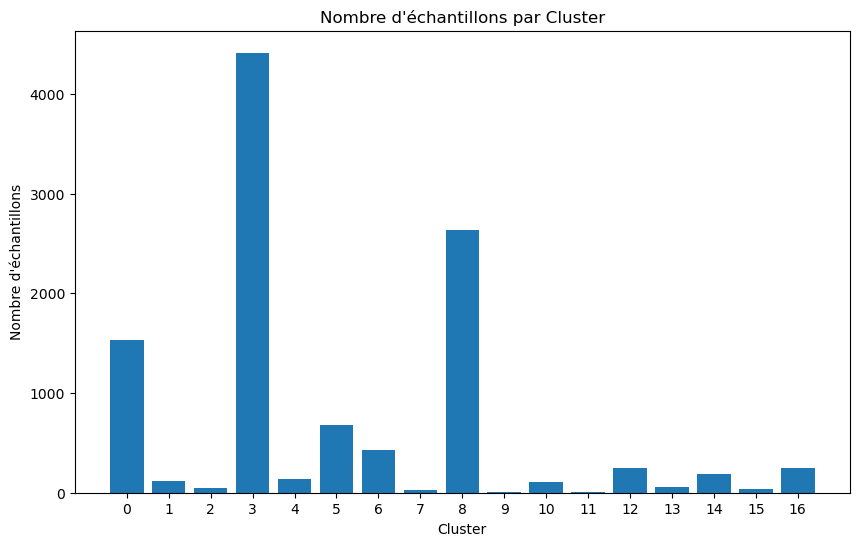

In [53]:
import matplotlib.pyplot as plt

# Obtenez le nombre d'échantillons par cluster
cluster_counts = x_train['Cluster'].value_counts()

# Triez les clusters par ordre croissant (facultatif)
cluster_counts = cluster_counts.sort_index()

# Créez un graphique à barres
plt.figure(figsize=(10, 6))
plt.bar(cluster_counts.index, cluster_counts.values)

# Ajoutez des étiquettes et un titre
plt.xlabel('Cluster')
plt.ylabel('Nombre d\'échantillons')
plt.title('Nombre d\'échantillons par Cluster')
plt.xticks(np.arange(0, 17, 1))

# Affichez le graphique
plt.show()


In [54]:
data['Cluster'] = x_train['Cluster']
x_train = x_train.drop(columns=['Cluster'])

# Vous pouvez ensuite afficher les établissements dans chaque cluster de la manière que vous préférez
for cluster_id in range(17):
    cluster_data = data[data['Cluster'] == cluster_id]
    
    print(f"Cluster {cluster_id} - Exemples d'établissements :")
    
    # Sélectionnez les colonnes pertinentes (Département de l’établissement, Filière de formation.1, Établissement)
    examples = cluster_data[['Département de l’établissement', 'Filière de formation.1', 'Établissement',
                            'Effectif total des candidats pour une formation', 'Dont effectif des candidates pour une formation',
                            'Sélectivité',
                            'Effectif des admis néo bacheliers généraux ayant eu une mention au bac',
                            'Effectif des admis néo bacheliers technologiques ayant eu une mention au bac',
                            'Effectif des admis néo bacheliers professionnels ayant eu une mention au bac',
                            'Dont effectif des admis issus de la même académie',
                            "Effectif des candidats en terminale générale ayant reçu une proposition d’admission de la part de l’établissement",
                            "Dont effectif des candidats boursiers en terminale générale ayant reçu une proposition d’admission de la part de l’établissement",
                            "Effectif des candidats en terminale technologique ayant reçu une proposition d’admission de la part de l’établissement",
                            "Dont effectif des candidats boursiers en terminale technologique ayant reçu une proposition d’admission de la part de l’établissement",
                            "Effectif des candidats en terminale professionnelle ayant reçu une proposition d’admission de la part de l’établissement",
                            "Dont effectif des candidats boursiers en terminale générale professionnelle ayant reçu une proposition d’admission de la part de l’établissement",
                            'Taux d’accès']].head()
    
    # Renommez les colonnes si nécessaire
    examples_formatted = examples.rename(columns={
        'Département de l’établissement': 'Département',
        'Filière de formation.1': 'Filière',
        'Établissement': 'Établissement',
        'Effectif total des candidats pour une formation': 'Effectif total',
        'Dont effectif des candidates pour une formation': 'dont candidates',
        'Sélectivité': 'Selectivité',
        'Effectif des admis néo bacheliers généraux ayant eu une mention au bac': 'Effectif avec mention au bac (général)',
        'Effectif des admis néo bacheliers technologiques ayant eu une mention au bac': 'Effectif avec mention au bac (techno)',
        'Effectif des admis néo bacheliers professionnels ayant eu une mention au bac': 'Effectif avec mention au bac (pro)',
        "Dont effectif des admis issus de la même académie": "Dont admis de la même académie",
        "Effectif des candidats en terminale générale ayant reçu une proposition d’admission de la part de l’établissement": 'Effectif candidats en term. gén.',
        "Dont effectif des candidats boursiers en terminale générale ayant reçu une proposition d’admission de la part de l’établissement": 'Dont boursiers en term. gén.',
        "Effectif des candidats en terminale technologique ayant reçu une proposition d’admission de la part de l’établissement": 'Effectif candidats en term. techno.',
        "Dont effectif des candidats boursiers en terminale technologique ayant reçu une proposition d’admission de la part de l’établissement": 'Dont boursiers en term. techno.',
        "Effectif des candidats en terminale professionnelle ayant reçu une proposition d’admission de la part de l’établissement": 'Effectif candidats en term. pro.',
        "Dont effectif des candidats boursiers en terminale générale professionnelle ayant reçu une proposition d’admission de la part de l’établissement":"Dont boursiers en term. gén. pro"})

    with pd.option_context('display.colheader_justify', 'center'):
        print(examples_formatted.to_string(index=False))
        
    print("="*80)

Cluster 0 - Exemples d'établissements :
   Département    Filière               Établissement                Effectif total  dont candidates  Selectivité  Effectif avec mention au bac (général)  Effectif avec mention au bac (techno)  Effectif avec mention au bac (pro)  Dont admis de la même académie  Effectif candidats en term. gén.  Dont boursiers en term. gén.  Effectif candidats en term. techno.  Dont boursiers en term. techno.  Effectif candidats en term. pro.  Dont boursiers en term. gén. pro  Taux d’accès
            Rhône DN MADE               Lycée La Martinière-Diderot       831             447             0                          4                                      7                                     1                                  2                              11.0                             1.0                             19.0                               4.0                               1.0                               1.0                      7.0    
      

/var/folders/nc/zwpbzb650nzbqhz3qts17gt00000gn/T/ipykernel_2636/1254965700.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



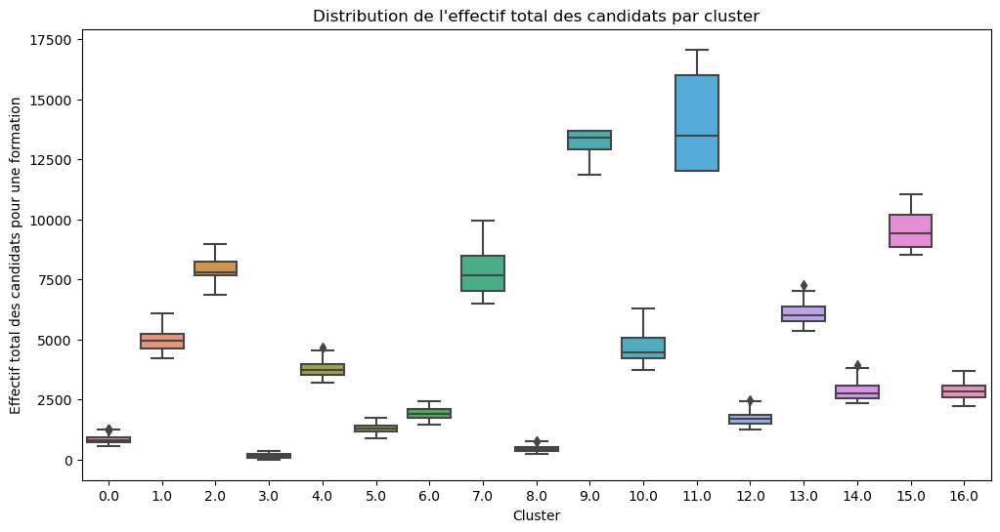

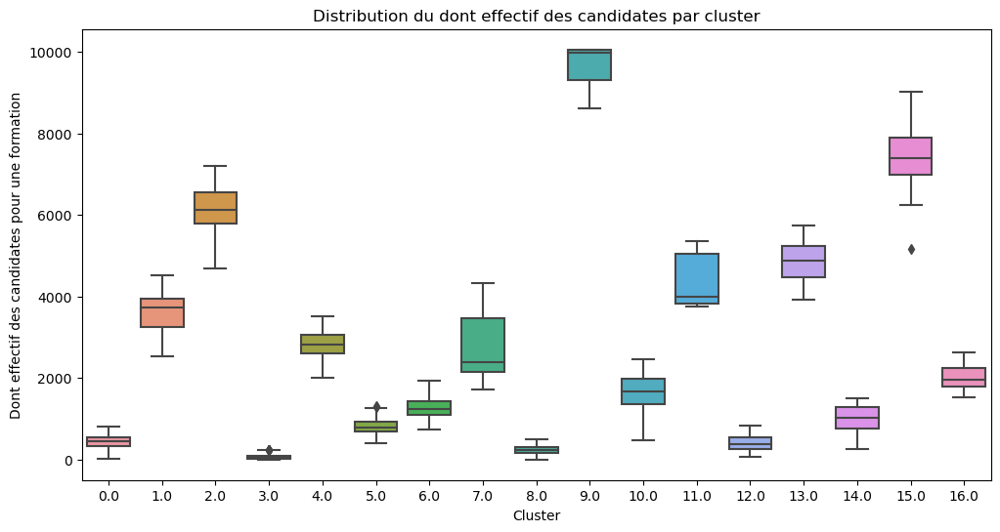

        Effectif total des candidats pour une formation               \
                                                   mean          std   
Cluster                                                                
0.0                                          836.714473   150.996267   
1.0                                         4970.101695   452.317383   
2.0                                         7904.760870   502.963227   
3.0                                          155.166138    82.515893   
4.0                                         3758.584507   320.228869   
5.0                                         1296.026316   174.837718   
6.0                                         1932.632319   231.133395   
7.0                                         7882.833333   980.606852   
8.0                                          448.893440   106.247276   
9.0                                        13118.200000   762.548818   
10.0                                        4624.873786   610.05

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sélection des features pertinentes dans le DataFrame
selected_features = X_train[['Effectif total des candidats pour une formation', 'Dont effectif des candidates pour une formation']]

# Ajoutez la colonne de clusters à votre DataFrame (si ce n'est pas déjà fait)
selected_features['Cluster'] = data['Cluster']

# Affichez la distribution des deux caractéristiques pour chaque cluster en utilisant des boîtes à moustaches
plt.figure(figsize=(12, 6))
sns.boxplot(x='Cluster', y='Effectif total des candidats pour une formation', data=selected_features)
plt.xlabel('Cluster')
plt.ylabel('Effectif total des candidats pour une formation')
plt.title('Distribution de l\'effectif total des candidats par cluster')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='Cluster', y='Dont effectif des candidates pour une formation', data=selected_features)
plt.xlabel('Cluster')
plt.ylabel('Dont effectif des candidates pour une formation')
plt.title('Distribution du dont effectif des candidates par cluster')
plt.show()

# Vous pouvez également calculer des statistiques descriptives pour chaque cluster
cluster_stats = selected_features.groupby('Cluster').agg({'Effectif total des candidats pour une formation': ['mean', 'std'],
                                                         'Dont effectif des candidates pour une formation': ['mean', 'std']})

# Affichez les statistiques descriptives pour chaque cluster
print(cluster_stats)


### X_test

In [56]:
# Créez un nouveau modèle K-Means
kmeans_new = KMeans(n_clusters=17)

# Ajustez le nouveau modèle aux données
kmeans_new.fit(x_train)

# Utilisez le modèle K-Means pour prédire les clusters pour les établissements dans x_test
labels_test = kmeans_new.predict(X_test[['Effectif total des candidats pour une formation', 'Dont effectif des candidates pour une formation']])

data.loc[X_test.index, 'Cluster'] = labels_test


In [57]:
inertia = kmeans_new.inertia_
print("Inertie :", inertia)

from sklearn.metrics import silhouette_score

silhouette_score_value = silhouette_score(x_train, kmeans_new.labels_)
print("Coefficient de silhouette :", silhouette_score_value)


Inertie : 698693648.4346789
Coefficient de silhouette : 0.468613307619883


### Visualisation Clustering

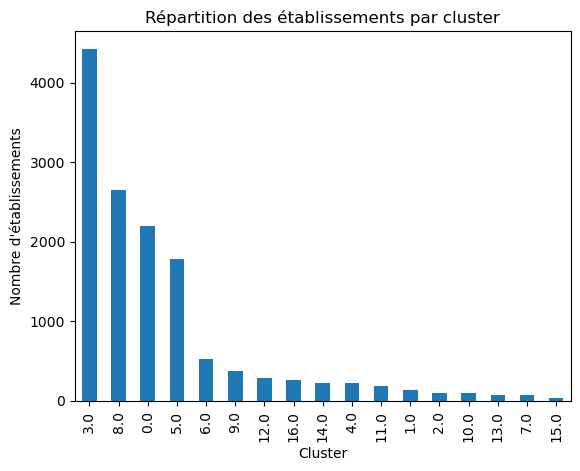

In [58]:
import matplotlib.pyplot as plt

# Supposons que 'data' est votre DataFrame contenant la colonne "Cluster"
cluster_counts = data['Cluster'].value_counts()
cluster_counts.plot(kind='bar')
plt.xlabel('Cluster')
plt.ylabel('Nombre d\'établissements')
plt.title('Répartition des établissements par cluster')
plt.show()


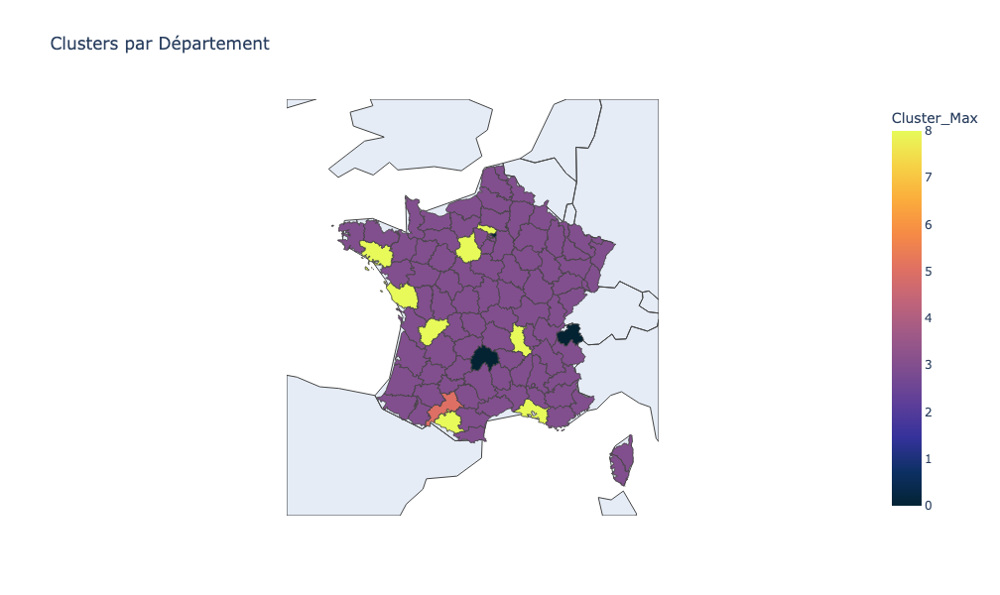

In [59]:
import pandas as pd

# Étape 1 : Regrouper les données par département et compter le nombre de chaque cluster
cluster_counts = data.groupby(['Département de l’établissement', 'Cluster'])['Cluster'].count().reset_index(name='Count')

# Étape 2 : Pour chaque département, trouvez le cluster le plus présent
max_cluster = cluster_counts.groupby('Département de l’établissement')['Count'].idxmax()

# Étape 3 : Ajouter une nouvelle colonne "Cluster_Max" à data_departement
data_departement['Cluster_Max'] = cluster_counts.loc[max_cluster]['Cluster'].values

# Assurez-vous que la colonne "Cluster" contient des valeurs numériques
data_departement['Cluster_Max'] = data_departement['Cluster_Max'].astype(int)

# À ce stade, data_departement a une nouvelle colonne "Cluster_Max" avec le cluster le plus présent pour chaque département

# Maintenant, vous pouvez utiliser le code que vous avez fourni pour créer la carte choroplèthe
# (Assurez-vous d'avoir importé la bibliothèque Plotly Express (px) au préalable)
import plotly.express as px

fig = px.choropleth(data_departement,
                    geojson=departement,
                    locations="Département",
                    featureidkey="properties.nom",
                    color="Cluster_Max",  # Utilisez la colonne Cluster_Max pour la couleur
                    hover_name="Département",
                    color_continuous_scale="thermal",
                    title="Clusters par Département")

fig.update_geos(scope="europe", center={"lat": 46.603354, "lon": 1.888334})
fig.update_geos(lonaxis_range=[-5, 10], lataxis_range=[40, 52])
fig.update_layout(width=800, height=600)

# Afficher la carte
fig.show()


### Prédiction du taux d'accès des établissements scolaires

In [60]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

In [61]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13644 entries, 0 to 13643
Data columns (total 43 columns):
 #   Column                                                                                                                                            Non-Null Count  Dtype  
---  ------                                                                                                                                            --------------  -----  
 0   Établissement                                                                                                                                     13644 non-null  object 
 1   Département de l’établissement                                                                                                                    13644 non-null  object 
 2   Sélectivité                                                                                                                                       13644 non-null  int64  
 3   Filière de 

In [62]:
from sklearn.model_selection import train_test_split

# X représente les caractéristiques (variables indépendantes)
# y représente la variable cible (Taux d'accès)
X = data.drop("Taux d’accès", axis=1)  # Supprimer la colonne de la variable cible
y = data["Taux d’accès"]  # Variable cible

# Fractionner les données en ensembles d'entraînement et de test (par exemple, 80% pour l'entraînement, 20% pour le test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [63]:
features = ["Effectif des admis en phase complémentaire","Sélectivité","Dont effectif des candidats pour une formation", "Effectif total des candidats pour une formation",
            "Dont effectif des candidates pour une formation"
            
           ]


In [64]:
X_train = pd.get_dummies(X_train[features])
X_test = pd.get_dummies(X_test[features])

### modèle simple

In [65]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_predict
import numpy as np
regressor = DecisionTreeRegressor(random_state=1, max_depth=5)


In [66]:
y_pred = cross_val_predict(regressor, X_train, y_train, cv=10)

In [67]:
# Calculez le RMSE
rmse = np.sqrt(mean_squared_error(y_train, y_pred))
print("RMSE:", rmse)

RMSE: 20.473863461689472


### Random forest

In [68]:
from sklearn.ensemble import RandomForestRegressor  # Utilisation de RandomForestRegressor pour la régression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, make_scorer
import pandas as pd

# Définir les hyperparamètres à rechercher
param_grid = {'max_depth': range(2, 16)}

# Créer un modèle de régression RandomForestRegressor
base_model = RandomForestRegressor(n_estimators=100, random_state=1)

# Utiliser GridSearchCV pour trouver la meilleure profondeur maximale (max_depth)
grid_search = GridSearchCV(base_model, param_grid, cv=5, scoring=make_scorer(mean_squared_error, greater_is_better=False))
grid_search.fit(X_train, y_train)

best_max_depth = grid_search.best_params_['max_depth']

# Créer le meilleur modèle avec la meilleure profondeur
best_model = RandomForestRegressor(n_estimators=100, max_depth=best_max_depth, random_state=1)

best_model.fit(X_train, y_train)

# Faire des prédictions
y_pred_best = best_model.predict(X_test)

# Calculer le RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred_best))
print(f"Best Max Depth: {best_max_depth}")
print(f"Test RMSE with Best Max Depth: {rmse:.4f}")


Best Max Depth: 8
Test RMSE with Best Max Depth: 19.7964


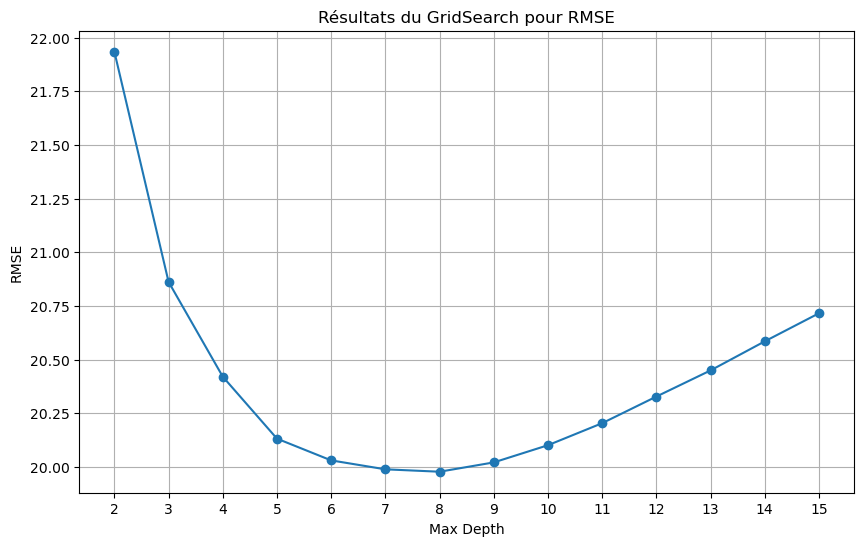

In [69]:
import matplotlib.pyplot as plt

results = grid_search.cv_results_
max_depths = param_grid['max_depth']
mean_test_rmse = np.sqrt(-results['mean_test_score'])  # Utilisation de sqrt(-mean_test_score) pour obtenir le RMSE

plt.figure(figsize=(10, 6))
plt.plot(max_depths, mean_test_rmse, marker='o')
plt.title('Résultats du GridSearch pour RMSE')
plt.xlabel('Max Depth')
plt.ylabel('RMSE')
plt.grid(True)
plt.xticks(max_depths)
plt.show()


In [70]:
feature_importances = best_model.feature_importances_
importance_df = pd.DataFrame({"Feature": X_train.columns, "Importance": feature_importances})
importance_df = importance_df.sort_values(by="Importance", ascending=False)
print(importance_df)

                                           Feature  Importance
0       Effectif des admis en phase complémentaire    0.396102
4  Dont effectif des candidates pour une formation    0.295674
1                                      Sélectivité    0.173948
3  Effectif total des candidats pour une formation    0.070708
2   Dont effectif des candidats pour une formation    0.063568


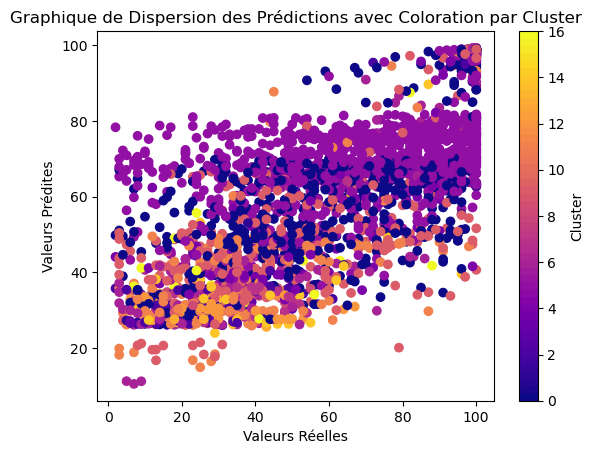

In [71]:
import matplotlib.pyplot as plt

# Créez une carte de couleurs en fonction du nombre de clusters
cmap = plt.cm.get_cmap('plasma', nombre_de_clusters)

# Utilisez les labels de cluster pour définir la couleur de chaque point
plt.scatter(y_test, y_pred_best, c=labels_test, cmap=cmap)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Valeurs Prédites")
plt.title("Graphique de Dispersion des Prédictions avec Coloration par Cluster")

# Affichez la légende pour les clusters
cbar = plt.colorbar()
cbar.set_label("Cluster")

plt.show()


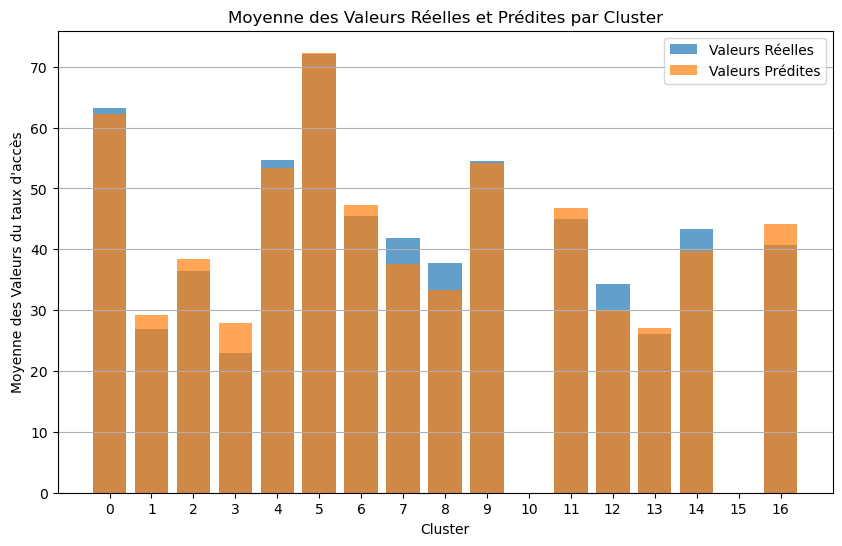

In [73]:
import numpy as np
import matplotlib.pyplot as plt

# Créez un DataFrame contenant les valeurs réelles, les valeurs prédites et les étiquettes de cluster
result_df = pd.DataFrame({'Valeurs Réelles': y_test, 'Valeurs Prédites': y_pred_best, 'Cluster': labels_test})

# Calculez la moyenne des valeurs réelles et des valeurs prédites pour chaque cluster
cluster_means = result_df.groupby('Cluster').agg({'Valeurs Réelles': 'mean', 'Valeurs Prédites': 'mean'}).reset_index()

# Trier les résultats par la moyenne des valeurs réelles (pour un meilleur affichage)
cluster_means = cluster_means.sort_values(by='Valeurs Réelles')

# Créez un barplot pour afficher les résultats
plt.figure(figsize=(10, 6))
plt.bar(cluster_means['Cluster'], cluster_means['Valeurs Réelles'], label='Valeurs Réelles', alpha=0.7)
plt.bar(cluster_means['Cluster'], cluster_means['Valeurs Prédites'], label='Valeurs Prédites', alpha=0.7)
plt.xlabel("Cluster")
plt.xticks(np.arange(0, 17, 1))
plt.ylabel("Moyenne des Valeurs du taux d'accès")
plt.title("Moyenne des Valeurs Réelles et Prédites par Cluster")
plt.legend()
plt.grid(axis='y')
plt.show()


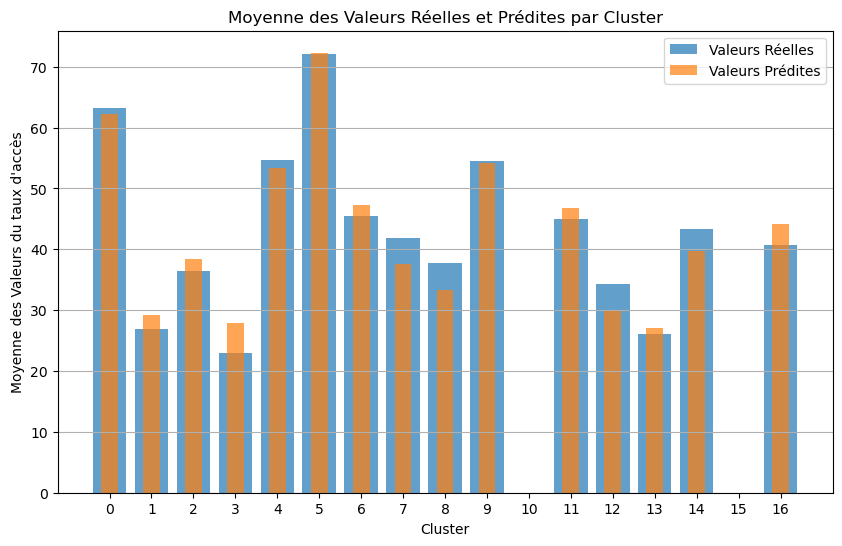

In [74]:
import numpy as np
import matplotlib.pyplot as plt

# Créez un DataFrame contenant les valeurs réelles, les valeurs prédites et les étiquettes de cluster
result_df = pd.DataFrame({'Valeurs Réelles': y_test, 'Valeurs Prédites': y_pred_best, 'Cluster': labels_test})

# Calculez la moyenne des valeurs réelles et des valeurs prédites pour chaque cluster
cluster_means = result_df.groupby('Cluster').agg({'Valeurs Réelles': 'mean', 'Valeurs Prédites': 'mean'}).reset_index()

# Trier les résultats par la moyenne des valeurs réelles (pour un meilleur affichage)
cluster_means = cluster_means.sort_values(by='Valeurs Réelles')

# Créez un barplot pour afficher les résultats
plt.figure(figsize=(10, 6))
plt.bar(cluster_means['Cluster'], cluster_means['Valeurs Réelles'], label='Valeurs Réelles', alpha=0.7)
plt.bar(cluster_means['Cluster'], cluster_means['Valeurs Prédites'], label='Valeurs Prédites', alpha=0.7, width=0.4)  # Utilisez width pour décaler les barres
plt.xlabel("Cluster")
plt.xticks(np.arange(0, 17, 1))
plt.ylabel("Moyenne des Valeurs du taux d'accès")
plt.title("Moyenne des Valeurs Réelles et Prédites par Cluster")
plt.legend()
plt.grid(axis='y')
plt.show()


In [77]:
cluster_means.head(16)

,Cluster,Valeurs Réelles,Valeurs Prédites
3,3,23.000000,27.941379
12,13,26.125000,27.123567
1,1,26.866667,29.284759
11,12,34.333333,30.019539
2,2,36.385965,38.374312
8,8,37.800000,33.384807
14,16,40.777778,44.168565
7,7,41.805556,37.516467
13,14,43.333333,39.692732
10,11,44.935135,46.732856


 99%|===================| 2708/2729 [00:41<00:00]        

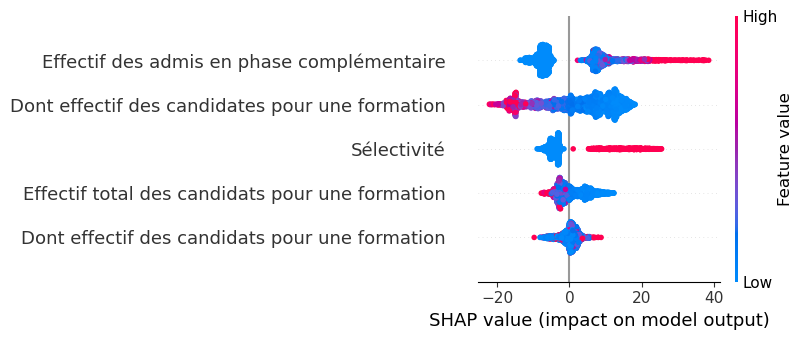

In [78]:
import shap


# Créez un explainer SHAP pour le modèle Random Forest ajusté
explainer = shap.Explainer(best_model, X_train)
instance_to_explain = X_test.iloc[0]
shap_values = explainer.shap_values(X_test)

# Affichez le graphique SHAP summary_plot
shap.summary_plot(shap_values, X_test, feature_names=X_train.columns)



### Gradient boosting

In [79]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
import numpy as np

# Créez un modèle Gradient Boosting
model = GradientBoostingRegressor(n_estimators=50, learning_rate=0.1, max_depth=5, random_state=1)

# Entraînez le modèle sur les données d'entraînement
model.fit(X_train, y_train)

# Faites des prédictions sur les données de test
y_pred_gb = model.predict(X_test)

# Calculez le RMSE pour évaluer les performances du modèle
rmse_gb = np.sqrt(mean_squared_error(y_test, y_pred_gb))
print("RMSE for Gradient Boosting:", rmse_gb)

RMSE for Gradient Boosting: 19.778252643074016


### Regression linéaire

In [ ]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, BayesianRidge
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
import numpy as np

# Créez une liste de noms de modèles
model_names = ['Linear Regression', 'Ridge', 'Lasso']

# Créez une liste de modèles correspondant aux noms
models = [LinearRegression(), Ridge(alpha=1.0), Lasso(alpha=1.0)]

# Initialisez une liste pour stocker les RMSE de chaque modèle
rmse_scores = []

# Boucle à travers chaque modèle
for model, name in zip(models, model_names):
    # Entraînez le modèle sur les données d'entraînement
    model.fit(X_train, y_train)

    # Faites des prédictions sur les données de test
    y_pred = model.predict(X_test)

    # Calculez le RMSE pour ce modèle
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    # Stockez le RMSE dans la liste
    rmse_scores.append((name, rmse))

# Affichez les RMSE pour chaque modèle
for name, rmse in rmse_scores:
    print(f"{name}: RMSE = {rmse:.4f}")


### Reseau de neurone

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.metrics import mean_squared_error
import numpy as np

# Créez un modèle séquentiel
model = keras.Sequential()

# Ajoutez des couches au modèle
model.add(layers.Dense(300, activation='relu', input_dim=X_train.shape[1]))  # Couche d'entrée avec 64 neurones et fonction d'activation ReLU
model.add(layers.Dense(300, activation='relu'))
model.add(layers.Dense(300, activation='relu'))
model.add(layers.Dense(300, activation='relu'))
model.add(layers.Dense(300, activation='relu'))
model.add(layers.Dense(300, activation='relu'))
model.add(layers.Dense(300, activation='relu'))# Couche cachée avec 32 neurones et fonction d'activation ReLU
model.add(layers.Dense(1))  # Couche de sortie avec 1 neurone (régression)

# Compilez le modèle en spécifiant la fonction de perte (loss) et l'optimiseur
model.compile(optimizer='adam', loss='mean_squared_error')  # Utilisez la MSE (Mean Squared Error) comme fonction de perte

# Entraînez le modèle sur les données d'entraînement
model.fit(X_train, y_train, epochs=20, batch_size=10, verbose=1)  # Vous pouvez ajuster le nombre d'époques et la taille du lot (batch size)

# Faites des prédictions sur les données de test
y_pred_nn = model.predict(X_test)

# Calculez le RMSE pour évaluer les performances du modèle
rmse_nn = np.sqrt(mean_squared_error(y_test, y_pred_nn))
print("RMSE for Neural Network:", rmse_nn)
